<a href="https://colab.research.google.com/github/haydaralidmrr/AdventureGameWithJava/blob/main/Thesis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Import Statements

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as py
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
import folium
import plotly.graph_objects as go
import base64
from io import BytesIO
from IPython.display import IFrame
#import cartopy.crs as ccrs
#import cartopy.feature as cf
#from mpl_toolkits.basemap import Basemap
#from choropie import ChoroPie as cp

### Notebook Presentation

In [2]:
pd.options.display.float_format = '{:,.2f}'.format

### Read the Data

In [3]:
df = pd.read_csv("graduationTheises.csv")


# Data Exploration & Cleaning

In [4]:
df.head()

,Transaction Number,Transaction Date,Transaction Type,Transaction Description,Debit Amount,Credit Amount,Balance,Category,Location City,Location Country
0,1,25/07/2022,BP,SAVE THE CHANGE,3.11,NaN,541.43,Savings,Nottingham,UK
1,2,25/07/2022,DEB,LIDL GB NOTTINGHA,15.02,NaN,544.54,Groceries,Nottingham,UK
2,3,25/07/2022,DEB,NON-GBP PURCH FEE,0.50,NaN,559.56,Others,Nottingham,UK
3,4,25/07/2022,DEB,NON-GBP TRANS FEE,0.37,NaN,560.06,Others,Nottingham,UK
4,5,25/07/2022,DEB,TRAVELIUM LLC,12.59,NaN,560.43,NaN,NaN,NaN


In [5]:
df.shape


(6567, 10)

In [6]:
df.tail()

,Transaction Number,Transaction Date,Transaction Type,Transaction Description,Debit Amount,Credit Amount,Balance,Category,Location City,Location Country
6562,6563,28/07/2015,DEB,Amazon Svcs Europe,5.49,NaN,"7,187.57",Amazon,Swansea,UK
6563,6564,28/07/2015,BP,SAVE THE CHANGE,1.10,NaN,"7,193.06",Savings,Swansea,UK
6564,6565,27/07/2015,DEB,Amazon UK Marketpl,6.39,NaN,"7,194.16",Amazon,Swansea,UK
6565,6566,27/07/2015,DEB,JS ONLINE GROCERY,316.51,NaN,"7,200.55",Groceries,Swansea,UK
6566,6567,27/07/2015,FPO,ALAN HOLLAND,"1,000.00",NaN,"7,517.06",Services,Swansea,UK


### Check for Duplicates

In [7]:
print(f'Any duplicates? {df.duplicated().values.any()}')

Any duplicates? False


##Check for NaN Values

In [8]:
print(f'Any NaN values among the data? {df.isna().values.any()}')

Any NaN values among the data? True


In [9]:
df.isna().sum()


Transaction Number            0
Transaction Date              0
Transaction Type             61
Transaction Description       0
Debit Amount                445
Credit Amount              6122
Balance                       0
Category                     24
Location City               672
Location Country            686
dtype: int64

sum of debit amount and credit amount gives us total rows of our data

In [10]:
col_subset = ['Category', 'Location City',
              'Location Country',"Transaction Type"]
df.loc[df["Category"].isna()][col_subset]


,Category,Location City,Location Country,Transaction Type
4,NaN,NaN,NaN,DEB
798,NaN,Nottingham,UK,DEB
970,NaN,Nottingham,UK,FPO
1357,NaN,Nottingham,UK,DEB
1720,NaN,Nottingham,UK,DEB
2231,NaN,NaN,NaN,TFR
2276,NaN,NaN,NaN,FPO
2278,NaN,NaN,NaN,TFR
2354,NaN,NaN,NaN,DEB
3673,NaN,NaN,NaN,DEB


### Type Conversions


* Convert the `Transaction Date` column to Pandas `Datetime` objects


In [11]:
df["Transaction Date"] = pd.to_datetime(df["Transaction Date"],dayfirst=True, format='mixed')
df_data =df.set_index(pd.DatetimeIndex(df["Transaction Date"])).drop("Transaction Date", axis=1)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6567 entries, 0 to 6566
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Transaction Number       6567 non-null   int64         
 1   Transaction Date         6567 non-null   datetime64[ns]
 2   Transaction Type         6506 non-null   object        
 3   Transaction Description  6567 non-null   object        
 4   Debit Amount             6122 non-null   float64       
 5   Credit Amount            445 non-null    float64       
 6   Balance                  6567 non-null   float64       
 7   Category                 6543 non-null   object        
 8   Location City            5895 non-null   object        
 9   Location Country         5881 non-null   object        
dtypes: datetime64[ns](1), float64(3), int64(1), object(5)
memory usage: 513.2+ KB


# Plotly Donut Chart: Percentage of Transaction Type

In [13]:
num_type = df["Transaction Type"].value_counts()
num_type

Transaction Type
DEB    3268
BP     1167
DD      775
CPT     448
FPO     307
BGC     158
SO      102
FPI      82
DEP      55
PAY      50
TFR      44
FEE      34
CHQ      16
Name: count, dtype: int64

In [14]:
chart = px.pie(labels=num_type.index, values=num_type.values,
            title="Percentage Transaction Types",
             color_discrete_sequence=[
                 px.colors.qualitative.Alphabet[6],
                 px.colors.qualitative.Alphabet[11],
               px.colors.qualitative.Plotly[2],
                 px.colors.qualitative.Plotly[7],
               px.colors.qualitative.G10[5]],
             names=num_type.index,
             hole=0.4)

chart.update_traces(textposition='inside', textfont_size=15, textinfo='percent+label')

chart.show()

**`Graphical representation of monthly total amounts for first year's credit amount and debit amount`**

In [15]:
out_vs_income2015 =df_data.resample("M").sum()[["Debit Amount", "Credit Amount"]][:12]
out_vs_income2015



,Debit Amount,Credit Amount
Transaction Date,,
2015-07-31,"1,485.87","3,545.99"
2015-08-31,"2,803.04","3,633.72"
2015-09-30,"3,145.10","3,539.89"
2015-10-31,"4,328.20","3,073.57"
2015-11-30,"2,920.55","3,244.39"
2015-12-31,"3,365.97","4,744.65"
2016-01-31,"3,239.97","3,132.44"
2016-02-29,"2,586.87","4,114.45"
2016-03-31,"3,594.80","4,140.99"


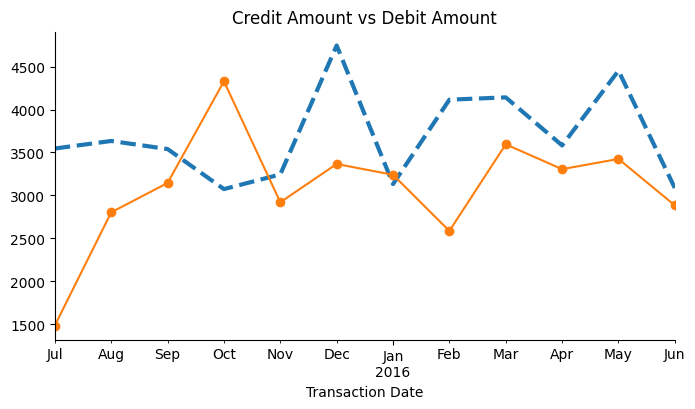

In [16]:
out_vs_income2015['Credit Amount'].plot(kind='line', figsize=(8, 4), title='Credit Amount vs Debit Amount',lw=3, linestyle='--')
out_vs_income2015['Debit Amount'].plot(kind='line',marker='o')
plt.gca().spines[['top', 'right']].set_visible(False)

***`Scatter plot showing the change in balance amount over the years`***

In [17]:
balance_years =df_data["Balance"].resample("Y").max()
balance_years


Transaction Date
2015-12-31   12,673.07
2016-12-31   18,889.42
2017-12-31   20,708.64
2018-12-31   21,952.23
2019-12-31   19,424.20
2020-12-31   94,066.01
2021-12-31    4,813.43
2022-12-31    4,301.40
Freq: A-DEC, Name: Balance, dtype: float64

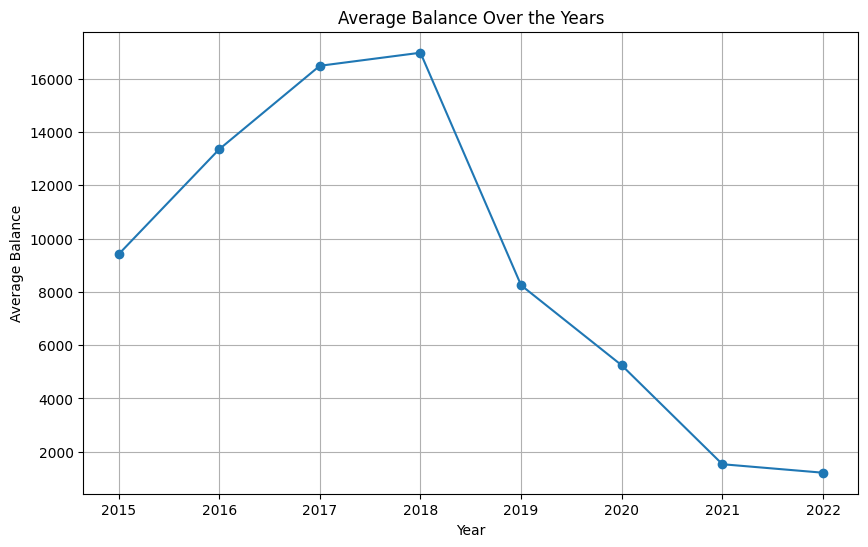

In [18]:
df['Transaction Date'] = pd.to_datetime(df['Transaction Date'], format='%d/%m/%Y')

df['Year'] = df['Transaction Date'].dt.year

yearly_balance = df.groupby('Year')['Balance'].mean().reset_index()

plt.figure(figsize=(10, 6))
plt.plot(yearly_balance['Year'], yearly_balance['Balance'], marker='o')
plt.title('Average Balance Over the Years')
plt.xlabel('Year')
plt.ylabel('Average Balance')
plt.grid(True)
plt.xticks(yearly_balance['Year'])
plt.show()

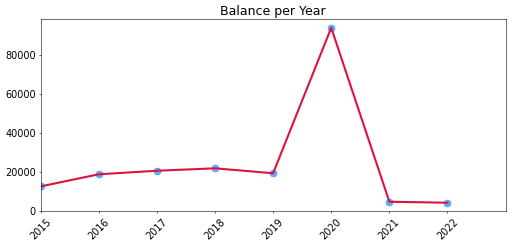

In [19]:
#moving_average = balance_years.rolling(window=5).mean()

plt.figure(figsize=(12,5), dpi=50)
plt.title('Balance per Year', fontsize=18)
plt.yticks(fontsize=14)
plt.xticks(ticks=np.arange(2015, 2023),
           fontsize=14,
           rotation=45)

ax = plt.gca()
ax.set_xlim(2015, 2023)

ax.scatter(x=balance_years.index.year,
           y=balance_years.values,
           c='dodgerblue',
           alpha=0.7,
           s=100,)

ax.plot(balance_years.index.year,
        balance_years.values,
        c='crimson',
        linewidth=3,)

plt.show()

***`Bar plot representation showing the number of expenses made in each category`***

In [20]:
df_cat_val = df_data["Category"].value_counts()
new_df_cat=df_cat_val[:22]

In [21]:
bar_plot = px.bar(x = df_cat_val.index, y= df_cat_val.values, title="Category Distrubution", hover_name=df_cat_val.index,
                   color=df_cat_val.values
                  ,color_continuous_scale="turbo")
bar_plot.update_layout(xaxis_title="Categories",
                      yaxis_title="Number Of Categories",coloraxis_showscale=False
                      )
bar_plot.show()

In [22]:
bar_plot = px.bar(x = new_df_cat.index, y= new_df_cat.values, title="Category Distrubution", hover_name=new_df_cat.index,
                   color=new_df_cat.values
                  ,color_continuous_scale="turbo")
bar_plot.update_layout(xaxis_title="Categories",
                      yaxis_title="Number Of Categories",coloraxis_showscale=False
                      )
bar_plot.show()

***`Percentage representation using a pie plot to show the distribution of expenses made in each category.`***

In [23]:
fig = px.pie(labels=df_cat_val.index, values=df_cat_val.values,
             names = df_cat_val.index, title="Category")

fig.update_traces(textposition='inside', textinfo='percent+label')

fig.show()

***`Pie plot representation showing the amount of transactions made in each category`***

In [24]:
cat_amounts = df[["Category","Credit Amount","Debit Amount"]].groupby("Category").sum()

sum_list = [ cat_amounts.iloc[i].sum() for i in range(len(cat_amounts))]

cat_amounts=cat_amounts.reset_index()
income = cat_amounts[cat_amounts["Credit Amount"]>0].loc[:, ['Category', 'Credit Amount']]
outgoing = cat_amounts[cat_amounts["Debit Amount"]>0].loc[:, ['Category', 'Debit Amount']]
outgoing


,Category,Debit Amount
0,Account transfer,"84,000.00"
1,Amazon,"21,271.45"
2,Bills,"43,269.55"
3,Cash,"27,661.98"
4,Clothes,971.63
5,Dine Out,"6,794.53"
6,Entertainment,"2,818.42"
7,Fitness,775.84
8,Food Shopping,4.52
9,Groceries,"11,368.18"


In [25]:
import plotly.graph_objects as go


income_labels = ["Paycheck", "Supplementary Income", "Interest", "Travel Reimbursement", "Home Improvement", "Insurance", "Dine Out", "Amazon"]
income_values = [265647.75, 236695.86, 217.60, 351.08, 246.00, 6.00, 3.00, 36.00]


outgoing_labels = ["Account transfer", "Amazon", "Bills", "Cash", "Clothes", "Dine Out", "Entertainment", "Fitness",
                   "Food Shopping", "Groceries", "Groceries", "Health", "Home Improvement", "Hotels", "Insurance",
                   "Investment", "Mortgage", "Other Shopping", "Others", "Purchase of uk.eg.org", "Rent",
                   "Safety Deposit Return", "Savings", "Services", "Services/Home Improvement", "Travel"]
outgoing_values = [84000.00, 21271.45, 43269.55, 27661.98, 971.63, 6794.53, 2818.42, 775.84,
                   4.52, 11368.18, 535.82, 50.00, 18369.52, 12399.73, 4851.21, 128614.88,
                   56392.70, 6895.75, 10354.02, 45.75, 178.80, 650.00, 26682.96, 23916.31, 895.00, 19164.29]

labels = ["Total", "Income", "Outgoing"] + income_labels + outgoing_labels
parents = ["", "Total", "Total"] + ["Income"] * len(income_labels) + ["Outgoing"] * len(outgoing_labels)
values = [sum(income_values) + sum(outgoing_values), sum(income_values), sum(outgoing_values)] + income_values + outgoing_values

fig = go.Figure(go.Sunburst(
    labels=labels,
    parents=parents,
    values=values,
    branchvalues="total",
    insidetextorientation='radial',

))


fig.update_layout(
    title="Total Amount Income and Outgoing Sunburst Chart",
    margin=dict(t=40, l=0, r=0, b=0)
)

fig.show()


In [26]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots


fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=income["Category"], values=income["Credit Amount"], name="Income"),
              1, 1)
fig.add_trace(go.Pie(labels=outgoing["Category"], values=outgoing["Debit Amount"], name="Outgoing"),
              1, 2)

fig.update_traces(hole=.4, hoverinfo="label+percent+name")

fig.update_layout(
    title_text="Total Amount Income and Outgoing",

    annotations=[dict(text='Income', x=0.18, y=0.5, font_size=20, showarrow=False),
                 dict(text='Outgoing', x=0.82, y=0.5, font_size=20, showarrow=False)]
    )
fig.show()

In [27]:
fig2 = px.pie(labels=cat_amounts.index, values=sum_list,
             names = cat_amounts.index, title="Category")

fig2.update_traces(textposition='inside', textinfo='percent+label')

fig2.show()

***`Choropleth maps showing the amount of expenditure made in each country on a world map`***

In [28]:
df_data["Location Country"].unique()

array(['UK', nan, 'Italy', 'Canada', 'Spain', 'Denmark', 'Netherlands',
       'USA', 'Portugal', 'France', 'Germany', 'Moldova', 'Greece',
       'Czech Republic', 'Prague', 'Hungary', 'Morocco'], dtype=object)

In [29]:
address = {'UK': 'GBR', 'USA': 'USA',
           'Canada': 'CAN', 'Spain': 'ESP','Greece': 'GRC', 'Italy': 'ITA',
           'Germany': 'DEU', 'Portugal': 'PRT','Czech Republic': 'CZE', 'Netherlands': 'NLD','Prague': 'CZE', 'Morocco': 'MAR',
        'Denmark': 'DNK', 'Moldova': 'MDA', 'Hungary': 'HUN', 'France': 'FRA'}
df_data["ISO"] = df_data["Location Country"].map(address)

df_countries = df_data.groupby(['Location Country',"ISO"],
                               as_index=False).agg({'Debit Amount': "sum"})
df_countries.sort_values('Debit Amount', ascending=False)



,Location Country,ISO,Debit Amount
14,UK,GBR,"465,583.36"
15,USA,USA,"2,220.52"
0,Canada,CAN,"1,510.77"
13,Spain,ESP,"1,307.94"
5,Greece,GRC,"1,247.33"
7,Italy,ITA,887.28
4,Germany,DEU,740.63
11,Portugal,PRT,604.80
1,Czech Republic,CZE,348.24
10,Netherlands,NLD,130.41


In [30]:

world_map = px.choropleth(df_countries,
                          locations="ISO",
                          color='Location Country',
                          hover_name='Debit Amount',
                          color_continuous_scale="Viridis"
                          )

world_map.update_layout(title_text="title",coloraxis_showscale=True, height=800)

world_map.show()

In [31]:
df_countriess = df_data.groupby(['Location Country',"Location City"],
                               as_index=False).agg({'Debit Amount': "sum"})
df_countriess=df_countriess[df_countriess["Location Country"]=="UK"]
df_countriess.sort_values('Debit Amount', ascending=False)

,Location Country,Location City,Debit Amount
39,UK,Nottingham,"296,646.01"
49,UK,Swansea,"161,764.34"
24,UK,Birmingham,921.43
52,UK,swansea,839.69
32,UK,Leicester,812.64
42,UK,Plymouth,798.85
33,UK,London,640.81
30,UK,Lampeter,500.35
21,UK,Bargoed,465.00
31,UK,Leeds,334.55


In [32]:
df_data.head()

,Transaction Number,Transaction Type,Transaction Description,Debit Amount,Credit Amount,Balance,Category,Location City,Location Country,ISO
Transaction Date,,,,,,,,,,
2022-07-25,1,BP,SAVE THE CHANGE,3.11,NaN,541.43,Savings,Nottingham,UK,GBR
2022-07-25,2,DEB,LIDL GB NOTTINGHA,15.02,NaN,544.54,Groceries,Nottingham,UK,GBR
2022-07-25,3,DEB,NON-GBP PURCH FEE,0.50,NaN,559.56,Others,Nottingham,UK,GBR
2022-07-25,4,DEB,NON-GBP TRANS FEE,0.37,NaN,560.06,Others,Nottingham,UK,GBR
2022-07-25,5,DEB,TRAVELIUM LLC,12.59,NaN,560.43,NaN,NaN,NaN,NaN


***`Sunburst representation showing the amount of expenditure made in each city within a country.`***

In [33]:
country_city_org = df_data.groupby(by=['Location Country',
                                       'Location City'
                                       ], as_index=False).agg({'Debit Amount': "sum"})

country_city_org = country_city_org.sort_values('Debit Amount', ascending=False)
country_city_org


,Location Country,Location City,Debit Amount
39,UK,Nottingham,"296,646.01"
49,UK,Swansea,"161,764.34"
0,Canada,Vancouver,"1,510.77"
57,USA,Phoenix,"1,263.19"
6,Greece,Malia,"1,247.33"
24,UK,Birmingham,921.43
52,UK,swansea,839.69
53,USA,Baltimore,819.22
32,UK,Leicester,812.64
42,UK,Plymouth,798.85


In [34]:
burst = px.sunburst(country_city_org,
                    path=['Location Country', 'Location City'],
                    values="Debit Amount",
                    title='Debit Amount by Countries and cities?',
                    color = "Location Country"
                   )

burst.update_layout(xaxis_title='Total Amount',
                    yaxis_title='City',
                    coloraxis_showscale=True)

burst.show()

In [35]:
df_not_na = df_data.dropna(subset=["Location Country","Category"])
fig = px.treemap(df_not_na, path=[px.Constant("all"), 'Location Country', 'Location City', 'Category'],
                 values='Debit Amount', color='Category')
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

In [36]:
df_not_na = df_data.dropna(subset=["Location Country","Category"]).reset_index()
df_not_na['Year'] = df_not_na['Transaction Date'].dt.year
df_not_na['month'] = df_not_na['Transaction Date'].dt.month
df_not_na['Day'] = df_not_na['Transaction Date'].dt.day
month_names = {
    1: 'January', 2: 'February', 3: 'March', 4: 'April',
    5: 'May', 6: 'June', 7: 'July', 8: 'August',
    9: 'September', 10: 'October', 11: 'November', 12: 'December'
}
df_not_na['Month'] = df_not_na['month'].map(month_names)
df_not_na=df_not_na.drop(["month"],axis=1)
df_not_na

,Transaction Date,Transaction Number,Transaction Type,Transaction Description,Debit Amount,Credit Amount,Balance,Category,Location City,Location Country,ISO,Year,Day,Month
0,2022-07-25,1,BP,SAVE THE CHANGE,3.11,NaN,541.43,Savings,Nottingham,UK,GBR,2022,25,July
1,2022-07-25,2,DEB,LIDL GB NOTTINGHA,15.02,NaN,544.54,Groceries,Nottingham,UK,GBR,2022,25,July
2,2022-07-25,3,DEB,NON-GBP PURCH FEE,0.50,NaN,559.56,Others,Nottingham,UK,GBR,2022,25,July
3,2022-07-25,4,DEB,NON-GBP TRANS FEE,0.37,NaN,560.06,Others,Nottingham,UK,GBR,2022,25,July
4,2022-07-25,6,DEB,Audible UK,7.99,NaN,573.02,Entertainment,Nottingham,UK,GBR,2022,25,July
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5871,2015-07-28,6563,DEB,Amazon Svcs Europe,5.49,NaN,"7,187.57",Amazon,Swansea,UK,GBR,2015,28,July
5872,2015-07-28,6564,BP,SAVE THE CHANGE,1.10,NaN,"7,193.06",Savings,Swansea,UK,GBR,2015,28,July
5873,2015-07-27,6565,DEB,Amazon UK Marketpl,6.39,NaN,"7,194.16",Amazon,Swansea,UK,GBR,2015,27,July
5874,2015-07-27,6566,DEB,JS ONLINE GROCERY,316.51,NaN,"7,200.55",Groceries,Swansea,UK,GBR,2015,27,July


In [37]:
fig = px.treemap(df_not_na, path=[px.Constant("all"), 'Location Country', 'Location City',"Year", 'Category'],
                values='Debit Amount', color='Category',
                 color_continuous_scale='Viridis',
                 title='Treemap display of how much was spent in which category by countries, cities and years', height=700)
fig.update_traces(texttemplate='%{label}<br>Value: %{value}')
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

In [38]:
fig = px.treemap(df_not_na, path=[px.Constant("all"), 'Year', 'Month',"Day", 'Category'],
                values='Credit Amount', color='Month',
                 color_continuous_scale='Rainbow',
                 title='Tree map display showing how much profit has been made in each category according to years, months and days', height=700)
fig.update_traces(texttemplate='%{label}<br>Value: %{value}')
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

In [39]:
types_trans = df_data["Transaction Type"].unique()
types_trans=list(types_trans)
types_trans


['BP',
 'DEB',
 'FPO',
 'FPI',
 'DD',
 'CPT',
 'BGC',
 'DEP',
 'PAY',
 nan,
 'SO',
 'TFR',
 'CHQ',
 'FEE']

In [40]:
new_data =df_data[['Location Country',"Transaction Type","Balance", "Category","Debit Amount","Credit Amount"]]
#.agg({'Debit Amount': "sum", "Credit Amount":"sum"})

new_data=new_data[new_data["Debit Amount"] != 84000]
new_data=new_data[new_data["Credit Amount"] != 83840.54]
new_data=new_data[new_data["Balance"] < 22000]
new_data = new_data.dropna(subset=['Location Country'],axis=0)

In [41]:
group_vars = new_data['Location Country'].unique()
dfg = pd.DataFrame({'Location Country':new_data['Location Country'].unique()})
dfg2= pd.DataFrame({'Category':new_data['Category'].unique()})
dfg2['dummy2'] = dfg2.index
dfg['dummy'] = dfg.index
df = pd.merge(new_data, dfg, on = 'Location Country', how='left')



In [42]:
import plotly.graph_objects as go
df = pd.merge(df, dfg2, on = 'Category', how='left')
df

,Location Country,Transaction Type,Balance,Category,Debit Amount,Credit Amount,dummy,dummy2
0,UK,BP,541.43,Savings,3.11,NaN,0,0
1,UK,DEB,544.54,Groceries,15.02,NaN,0,1
2,UK,DEB,559.56,Others,0.50,NaN,0,2
3,UK,DEB,560.06,Others,0.37,NaN,0,2
4,UK,DEB,573.02,Entertainment,7.99,NaN,0,3
...,...,...,...,...,...,...,...,...
5871,UK,DEB,"7,187.57",Amazon,5.49,NaN,0,5
5872,UK,BP,"7,193.06",Savings,1.10,NaN,0,0
5873,UK,DEB,"7,194.16",Amazon,6.39,NaN,0,5
5874,UK,DEB,"7,200.55",Groceries,316.51,NaN,0,1


In [43]:
df["Category"]=df["Category"].astype("category")

In [44]:
dimensions = list([
                  dict(range=[0,df['dummy'].max()],
                       tickvals = dfg['dummy'], ticktext = dfg['Location Country'],
                       label='Country', values=df['dummy']),
                  dict(range=[0,df['dummy2'].max()],
                       tickvals = dfg2['dummy2'], ticktext = dfg2['Category'],
                       label='Category', values=df['dummy2']),
                  dict(range=[df['Credit Amount'].min(),df['Credit Amount'].max()],
                        label='Credit Amount', values=df['Credit Amount']),
                  dict(range=[df['Debit Amount'].min(),df['Debit Amount'].max()],
                       label='Debit Amount', values=df['Debit Amount']),
                  dict(range=[df['Balance'].min(),df['Balance'].max()],
                       label='Balance', values=df['Balance']),



                  ])

fig = go.Figure(data=go.Parcoords(line = dict(color = df['Category'].cat.codes,
                   #colorscale = [[0,'yellow'],[0.5,'blue'],[1,'red']],
                   colorscale='Inferno',
                   #colorscale = [[0,'rgba(200,0,0,0.1)'],[0.5,'rgba(0,200,0,0.1)'],[1,'rgba(0,0,200,0.1)']],
                  showscale=False                      ), dimensions=dimensions,), layout=go.Layout(height=700))

fig.update_layout(
    #plot_bgcolor = 'black',
    #paper_bgcolor = 'black'
     updatemenus=[
        dict(
            buttons=list([
                dict(
                    args=["line.colorscale", "Inferno"],
                    label='Inferno',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Viridis"],
                    label='Viridis',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Cividis"],
                    label='Cividis',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Plasma"],
                    label='Plasma',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Magma"],
                    label='Magma',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Blues"],
                    label='Blues',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Greens"],
                    label='Greens',
                    method='restyle'
                ),
            ]),
            direction='down',
            showactive=True,
            x=0.8,
            xanchor='center',
            y=1.2,
            yanchor='top'
        ),
    ],
    title='Parallel Category',
)

fig.show()

In [45]:
df_uk_cities_par=df_data[['Location Country',"Location City","Category"]].reset_index()
df_uk_cities_par=df_uk_cities_par.loc[df_uk_cities_par['Location Country'] == "UK"]
df_uk_cities_par.drop(columns=["Location Country"],axis=1, inplace=True)
#df_uk_cities=df_uk_cities[["Category","Location City","Debit Amount"]].groupby(["Location City","Category"],as_index=False).agg({'Debit Amount': "sum"})
df_uk_cities_par

,Transaction Date,Location City,Category
0,2022-07-25,Nottingham,Savings
1,2022-07-25,Nottingham,Groceries
2,2022-07-25,Nottingham,Others
3,2022-07-25,Nottingham,Others
5,2022-07-25,Nottingham,Entertainment
...,...,...,...
6562,2015-07-28,Swansea,Amazon
6563,2015-07-28,Swansea,Savings
6564,2015-07-27,Swansea,Amazon
6565,2015-07-27,Swansea,Groceries


In [46]:
dfg_cat= pd.DataFrame({'Category':df_uk_cities_par['Category'].unique()})
dfg_cat['dummy2'] = dfg_cat.index
df_paral_uk = pd.merge(df_uk_cities_par, dfg_cat, on = 'Category', how='left')

In [47]:
df_cat_paral = df_data[["Location Country","Category","Transaction Type","Debit Amount"]].reset_index()
#df_cat_paral.drop(["Transaction Date"], axis=1, inplace=True)
#df_cat_paral.dropna(axis=0, inplace=True)

In [48]:
dfg_cat= pd.DataFrame({'Category':df_cat_paral['Category'].unique()})
dfg_cat['dummy2'] = dfg_cat.index

In [49]:
df_paral = pd.merge(df_cat_paral, dfg_cat, on = 'Category', how='left')
df_paral

,Transaction Date,Location Country,Category,Transaction Type,Debit Amount,dummy2
0,2022-07-25,UK,Savings,BP,3.11,0
1,2022-07-25,UK,Groceries,DEB,15.02,1
2,2022-07-25,UK,Others,DEB,0.50,2
3,2022-07-25,UK,Others,DEB,0.37,2
4,2022-07-25,NaN,NaN,DEB,12.59,3
...,...,...,...,...,...,...
6562,2015-07-28,UK,Amazon,DEB,5.49,6
6563,2015-07-28,UK,Savings,BP,1.10,0
6564,2015-07-27,UK,Amazon,DEB,6.39,6
6565,2015-07-27,UK,Groceries,DEB,316.51,1


In [50]:
#df_paral_uk[df_paral_uk["Location City"].value_counts()>2]
df_paral_uk=df_paral_uk[df_paral_uk["Location City"].map(df_paral_uk["Location City"].value_counts()) > 2]
df_paral_uk=df_paral_uk[df_paral_uk["Category"].map(df_paral_uk["Category"].value_counts()) > 55]

In [51]:
df_paral["Category"]=df_paral["Category"].astype("category")
df_paral_uk["Category"]=df_paral_uk["Category"].astype("category")
df_paral.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6567 entries, 0 to 6566
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Transaction Date  6567 non-null   datetime64[ns]
 1   Location Country  5881 non-null   object        
 2   Category          6543 non-null   category      
 3   Transaction Type  6506 non-null   object        
 4   Debit Amount      6122 non-null   float64       
 5   dummy2            6567 non-null   int64         
dtypes: category(1), datetime64[ns](1), float64(1), int64(1), object(2)
memory usage: 264.3+ KB


In [52]:
df_paral_uk['Year'] = df_paral_uk['Transaction Date'].dt.year



fig = go.Figure()

fig.add_trace(
    go.Parcats(
        dimensions=[
            {'label': 'Categories', 'values': df_paral_uk['Category']},
            {'label': 'UK Cities', 'values': df_paral_uk['Location City']},
            {'label': 'Years', 'values': df_paral_uk['Year']}
        ],
        line={'color': df_paral_uk['Category'].cat.codes, 'colorscale': 'Inferno'},
        hoveron='dimension',
        hoverinfo='count+probability'
    )
)


fig.update_layout(
    updatemenus=[
        dict(
            buttons=list([
                dict(
                    args=["line.colorscale", "Inferno"],
                    label='Inferno',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Viridis"],
                    label='Viridis',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Cividis"],
                    label='Cividis',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Plasma"],
                    label='Plasma',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Magma"],
                    label='Magma',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Blues"],
                    label='Blues',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Greens"],
                    label='Greens',
                    method='restyle'
                ),
            ]),
            direction='down',
            showactive=True,
            x=0.8,
            xanchor='center',
            y=1.08,
            yanchor='top'
        ),
    ],
    title='Parallel Sets Visualization with Datetime Information',
    coloraxis_colorbar=dict(
        title="Category"
    ),
   # margin=dict(l=10, r=10, t=40, b=10)
)


fig.show()

In [53]:
df_paral['Year'] = df_paral['Transaction Date'].dt.year



fig = go.Figure()

fig.add_trace(
    go.Parcats(
        dimensions=[
            {'label': 'Country', 'values': df_paral['Location Country']},
            {'label': 'Category', 'values': df_paral['Category']},
            {'label': 'Transaction Type', 'values': df_paral['Transaction Type']}
        ],
        line={'color': df_paral['Category'].cat.codes, 'colorscale': 'Inferno'},
        hoveron='dimension',
        hoverinfo='count+probability'
    )
)


fig.update_layout(
    updatemenus=[
        dict(
            buttons=list([
                dict(
                    args=["line.colorscale", "Inferno"],
                    label='Inferno',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Viridis"],
                    label='Viridis',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Cividis"],
                    label='Cividis',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Plasma"],
                    label='Plasma',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Magma"],
                    label='Magma',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Blues"],
                    label='Blues',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Greens"],
                    label='Greens',
                    method='restyle'
                ),
            ]),
            direction='down',
            showactive=True,
            x=0.8,
            xanchor='center',
            y=1.08,
            yanchor='top'
        ),
    ],
    title='Parallel Sets Visualization',
    coloraxis_colorbar=dict(
        title="Count"
    ),
    margin=dict(l=10, r=10, t=40, b=10)
)


fig.show()

In [54]:
df_paral['Year'] = df_paral['Transaction Date'].dt.year



fig = go.Figure()

fig.add_trace(
    go.Parcats(
        dimensions=[
            {'label': 'Year', 'values': df_paral['Year']},
            {'label': 'Category', 'values': df_paral['Category']},
            {'label': 'Transaction Type', 'values': df_paral['Transaction Type']}
        ],
        line={'color': df_paral['Category'].cat.codes, 'colorscale': 'Inferno'},
        hoveron='dimension',
        hoverinfo='count+probability'
    )
)


fig.update_layout(
    updatemenus=[
        dict(
            buttons=list([
                dict(
                    args=["line.colorscale", "Inferno"],
                    label='Inferno',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Viridis"],
                    label='Viridis',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Cividis"],
                    label='Cividis',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Plasma"],
                    label='Plasma',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Magma"],
                    label='Magma',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Blues"],
                    label='Blues',
                    method='restyle'
                ),
                dict(
                    args=["line.colorscale", "Greens"],
                    label='Greens',
                    method='restyle'
                ),
            ]),
            direction='down',
            showactive=True,
            x=0.8,
            xanchor='center',
            y=1.08,
            yanchor='top'
        ),
    ],
    title='Parallel Sets Visualization with Datetime Information',
    coloraxis_colorbar=dict(
        title="Count"
    ),
    margin=dict(l=10, r=10, t=40, b=10)
)


fig.show()

In [55]:
df_uk_cities=df_data.groupby(['Location Country',"Location City","Category"],
                               as_index=False).agg({'Debit Amount': "sum"})
df_uk_cities=df_uk_cities.loc[df_uk_cities['Location Country'] == "UK"]
df_uk_cities.drop(columns=["Location Country"],axis=1, inplace=True)
df_uk_cities=df_uk_cities[["Category","Location City","Debit Amount"]].groupby(["Location City","Category"],as_index=False).agg({'Debit Amount': "sum"})
b=df_uk_cities[df_uk_cities["Location City"]=="London"][["Category","Debit Amount"]].set_index("Category")
b.values.sum()


640.8100000000001

In [56]:
df_uk_cities

,Location City,Category,Debit Amount
0,Bargoed,Dine Out,465.00
1,Belfast,Cash,20.00
2,Belfast,Dine Out,119.20
3,Belfast,Travel,23.00
4,Belfast,Dine Out,9.98
...,...,...,...
101,Worcester,Entertainment,29.75
102,nottingham,Cash,280.00
103,swansea,Cash,60.00
104,swansea,Home Improvement,779.69


In [57]:
list(df_uk_cities["Location City"].unique())

['Bargoed',
 'Belfast',
 'Belfast ',
 'Birmingham',
 'Bristol',
 'Bushmills',
 'Cambridge',
 'Cardiff',
 'Derby',
 'Lampeter',
 'Leeds',
 'Leicester',
 'London',
 'London/birmingham',
 'Manchester',
 'Mansfiled',
 'Middleton',
 'Newcastle upon Tyne',
 'Nottingham',
 'Nottingham ',
 'Oakham',
 'Plymouth',
 'Plymouth/Newcatle',
 'Reading',
 'Sheerness',
 'Sheffild ',
 'Shrewsbury',
 'Solihull',
 'Swansea',
 'Worcester',
 'nottingham',
 'swansea']

In [58]:
citiess = list(df_uk_cities["Location City"].unique())
citiess



['Bargoed',
 'Belfast',
 'Belfast ',
 'Birmingham',
 'Bristol',
 'Bushmills',
 'Cambridge',
 'Cardiff',
 'Derby',
 'Lampeter',
 'Leeds',
 'Leicester',
 'London',
 'London/birmingham',
 'Manchester',
 'Mansfiled',
 'Middleton',
 'Newcastle upon Tyne',
 'Nottingham',
 'Nottingham ',
 'Oakham',
 'Plymouth',
 'Plymouth/Newcatle',
 'Reading',
 'Sheerness',
 'Sheffild ',
 'Shrewsbury',
 'Solihull',
 'Swansea',
 'Worcester',
 'nottingham',
 'swansea']

In [59]:


df_uk_cities['Location City'].unique()

array(['Bargoed', 'Belfast', 'Belfast ', 'Birmingham', 'Bristol',
       'Bushmills', 'Cambridge', 'Cardiff', 'Derby', 'Lampeter', 'Leeds',
       'Leicester', 'London', 'London/birmingham', 'Manchester',
       'Mansfiled', 'Middleton', 'Newcastle upon Tyne', 'Nottingham',
       'Nottingham ', 'Oakham', 'Plymouth', 'Plymouth/Newcatle',
       'Reading', 'Sheerness', 'Sheffild ', 'Shrewsbury', 'Solihull',
       'Swansea', 'Worcester', 'nottingham', 'swansea'], dtype=object)

In [61]:
import json

# İngiltere sınırlarını içeren GeoJSON dosyasının yüklenmesi
with open('england.geojson', 'r') as f:
    england_geojson = json.load(f)

In [62]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go



correct_cities = {
    'Bargoed': 'Bargoed',
    'Belfast': 'Belfast',
    'Birmingham': 'Birmingham',
    'Bristol': 'Bristol',
    'Bushmills': 'Bushmills',
    'Cambridge': 'Cambridge',
    'Cardiff': 'Cardiff',
    'Derby': 'Derby',
    'Lampeter': 'Lampeter',
    'Leeds': 'Leeds',
    'Leicester': 'Leicester',
    'London': 'London',
    'Manchester': 'Manchester',
    'Mansfield': 'Mansfield',
    'Middleton': 'Middleton',
    'Newcastle upon Tyne': 'Newcastle upon Tyne',
    'Nottingham': 'Nottingham',
    'Oakham': 'Oakham',
    'Plymouth': 'Plymouth',
    'Reading': 'Reading',
    'Sheerness': 'Sheerness',
    'Sheffield': 'Sheffield',
    'Shrewsbury': 'Shrewsbury',
    'Solihull': 'Solihull',
    'Swansea': 'Swansea',
    'Worcester': 'Worcester'
}

df_uk_cities['Location City'] = df_uk_cities['Location City'].apply(lambda x: correct_cities.get(x, 'Unknown'))
df_uk_cities = df_uk_cities[df_uk_cities['Location City'] != 'Unknown']


city_coords = {
    'Bargoed': [51.6912, -3.2290],
    'Belfast': [54.5973, -5.9301],
    'Birmingham': [52.4862, -1.8904],
    'Bristol': [51.4545, -2.5879],
    'Bushmills': [55.2045, -6.5117],
    'Cambridge': [52.2053, 0.1218],
    'Cardiff': [51.4816, -3.1791],
    'Derby': [52.9225, -1.4746],
    'Lampeter': [52.1133, -4.0769],
    'Leeds': [53.8008, -1.5491],
    'Leicester': [52.6369, -1.1398],
    'London': [51.5074, -0.1278],
    'Manchester': [53.4808, -2.2426],
    'Mansfield': [53.1439, -1.1962],
    'Middleton': [53.5500, -2.1989],
    'Newcastle upon Tyne': [54.9783, -1.6175],
    'Nottingham': [52.9548, -1.1581],
    'Oakham': [52.6705, -0.7260],
    'Plymouth': [50.3755, -4.1427],
    'Reading': [51.4543, -0.9781],
    'Sheerness': [51.4406, 0.7605],
    'Sheffield': [53.3811, -1.4701],
    'Shrewsbury': [52.7073, -2.7553],
    'Solihull': [52.4128, -1.7782],
    'Swansea': [51.6214, -3.9436],
    'Worcester': [52.1920, -2.2200]
}


min_lat, max_lat = 49.0, 61.0  # Approx latitude range for UK
min_lon, max_lon = -8.0, 2.0   # Approx longitude range for UK

def normalize(value, min_val, max_val):
    return (value - min_val) / (max_val - min_val)

fig=go.Figure()


for city in df_uk_cities['Location City'].unique():
    if city in city_coords:
        city_data = df_uk_cities[df_uk_cities['Location City'] == city]
        coords = city_coords[city]
        pie = go.Pie(values=city_data['Debit Amount'], labels=city_data['Category'],
                     textinfo='none', marker=dict(line=dict(color='#000000', width=2)),
                     domain=dict(x=[normalize(coords[1], min_lon, max_lon), normalize(coords[1], min_lon, max_lon) + 0.05],
                                 y=[normalize(coords[0], min_lat, max_lat), normalize(coords[0], min_lat, max_lat) + 0.05]))

        fig.add_trace(pie)


fig.update_layout(
    title='UK Cities Expenditure',
    #mapbox=dict(center={"lat": 53.5, "lon": -1.5}, zoom=5),
    #autosize=False,
    #width=1000,
    #height=1000
    margin=dict(t=0, b=0, l=0, r=0)

)

fig.show()


In [63]:
import plotly.graph_objects as go
import pandas as pd



# Strip leading/trailing whitespaces from city names
df_uk_cities['Location City'] = df_uk_cities['Location City'].str.strip()

# Remove any potential slashes or other unwanted characters in city names
df_uk_cities['Location City'] = df_uk_cities['Location City'].str.replace(r'[^a-zA-Z\s]', '', regex=True)

# Manually correct or remove incorrect city names
correct_cities = {
    'Bargoed': 'Bargoed',
    'Belfast': 'Belfast',
    'Birmingham': 'Birmingham',
    'Bristol': 'Bristol',
    'Bushmills': 'Bushmills',
    'Cambridge': 'Cambridge',
    'Cardiff': 'Cardiff',
    'Derby': 'Derby',
    'Lampeter': 'Lampeter',
    'Leeds': 'Leeds',
    'Leicester': 'Leicester',
    'London': 'London',
    'Manchester': 'Manchester',
    'Mansfield': 'Mansfield',
    'Middleton': 'Middleton',
    'Newcastle upon Tyne': 'Newcastle upon Tyne',
    'Nottingham': 'Nottingham',
    'Oakham': 'Oakham',
    'Plymouth': 'Plymouth',
    'Reading': 'Reading',
    'Sheerness': 'Sheerness',
    'Sheffield': 'Sheffield',
    'Shrewsbury': 'Shrewsbury',
    'Solihull': 'Solihull',
    'Swansea': 'Swansea',
    'Worcester': 'Worcester'
}

# Correct the city names in the dataframe
df_uk_cities['Location City'] = df_uk_cities['Location City'].apply(lambda x: correct_cities.get(x, 'Unknown'))

# Remove any rows with 'Unknown' city
df_uk_cities = df_uk_cities[df_uk_cities['Location City'] != 'Unknown']




# List of unique cities and categories
cities = df_uk_cities['Location City'].unique()
categories = df_uk_cities['Category'].unique()


city_coords = {
    'Bargoed': [51.6912, -3.2290],
    'Belfast': [54.5973, -5.9301],
    'Birmingham': [52.4862, -1.8904],
    'Bristol': [51.4545, -2.5879],
    'Bushmills': [55.2045, -6.5117],
    'Cambridge': [52.2053, 0.1218],
    'Cardiff': [51.4816, -3.1791],
    'Derby': [52.9225, -1.4746],
    'Lampeter': [52.1133, -4.0769],
    'Leeds': [53.8008, -1.5491],
    'Leicester': [52.6369, -1.1398],
    'London': [51.5074, -0.1278],
    'Manchester': [53.4808, -2.2426],
    'Mansfield': [53.1439, -1.1962],
    'Middleton': [53.5500, -2.1989],
    'Newcastle upon Tyne': [54.9783, -1.6175],
    'Nottingham': [52.9548, -1.1581],
    'Oakham': [52.6705, -0.7260],
    'Plymouth': [50.3755, -4.1427],
    'Reading': [51.4543, -0.9781],
    'Sheerness': [51.4406, 0.7605],
    'Sheffield': [53.3811, -1.4701],
    'Shrewsbury': [52.7073, -2.7553],
    'Solihull': [52.4128, -1.7782],
    'Swansea': [51.6214, -3.9436],
    'Worcester': [52.1920, -2.2200]
}

min_lat, max_lat = 49.0, 61.0  # UK için yaklaşık enlem aralığı
min_lon, max_lon = -8.0, 2.0   # UK için yaklaşık boylam aralığı

def normalize(value, min_val, max_val):
    return (value - min_val) / (max_val - min_val)


fig = go.Figure()


for city in df_uk_cities['Location City'].unique():
    if city in city_coords:
        city_data = df_uk_cities[df_uk_cities['Location City'] == city]
        coords = city_coords[city]
        normalized_x = normalize(coords[1], min_lon, max_lon)
        normalized_y = normalize(coords[0], min_lat, max_lat)
        fig.add_trace(go.Scattergeo(
            locationmode='ISO-3',
            lon=[coords[1]],
            lat=[coords[0]],
            text=city,
            mode='markers',
            marker=dict(size=0.1)
        ))
        fig.add_trace(go.Pie(
            values=city_data['Debit Amount'],
            labels=city_data['Category'],
            textinfo='none',
            marker=dict(line=dict(color='#000000', width=2)),
            domain=dict(x=[normalized_x, normalized_x + 0.05], y=[normalized_y, normalized_y + 0.05])
        ))

fig.update_layout(
    title='UK Cities Expenditure',
    geo=dict(
        scope='europe',
        projection_type='mercator',
        showland=True,
        landcolor='rgb(217, 217, 217)',
        subunitwidth=1,
        countrywidth=1,
        subunitcolor='rgb(255, 255, 255)',
        countrycolor='rgb(255, 255, 255)'
    ),
)

fig.show()



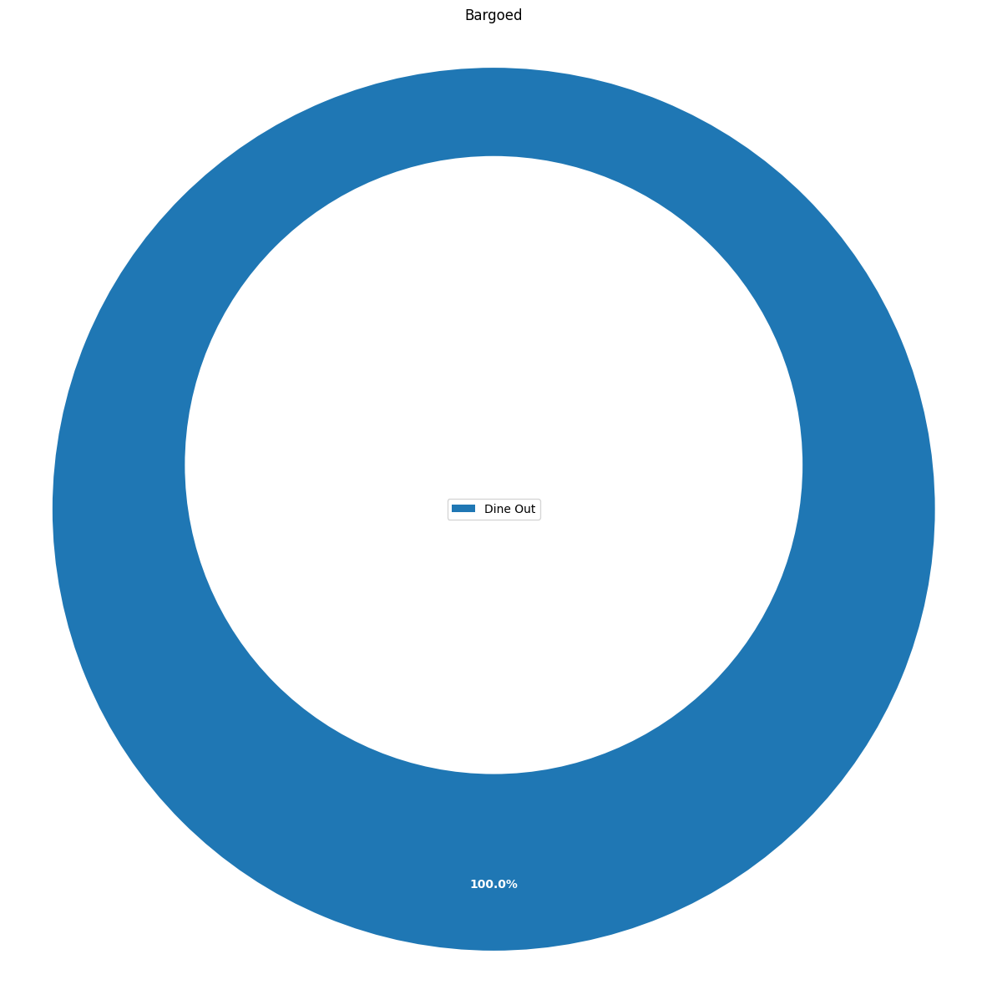
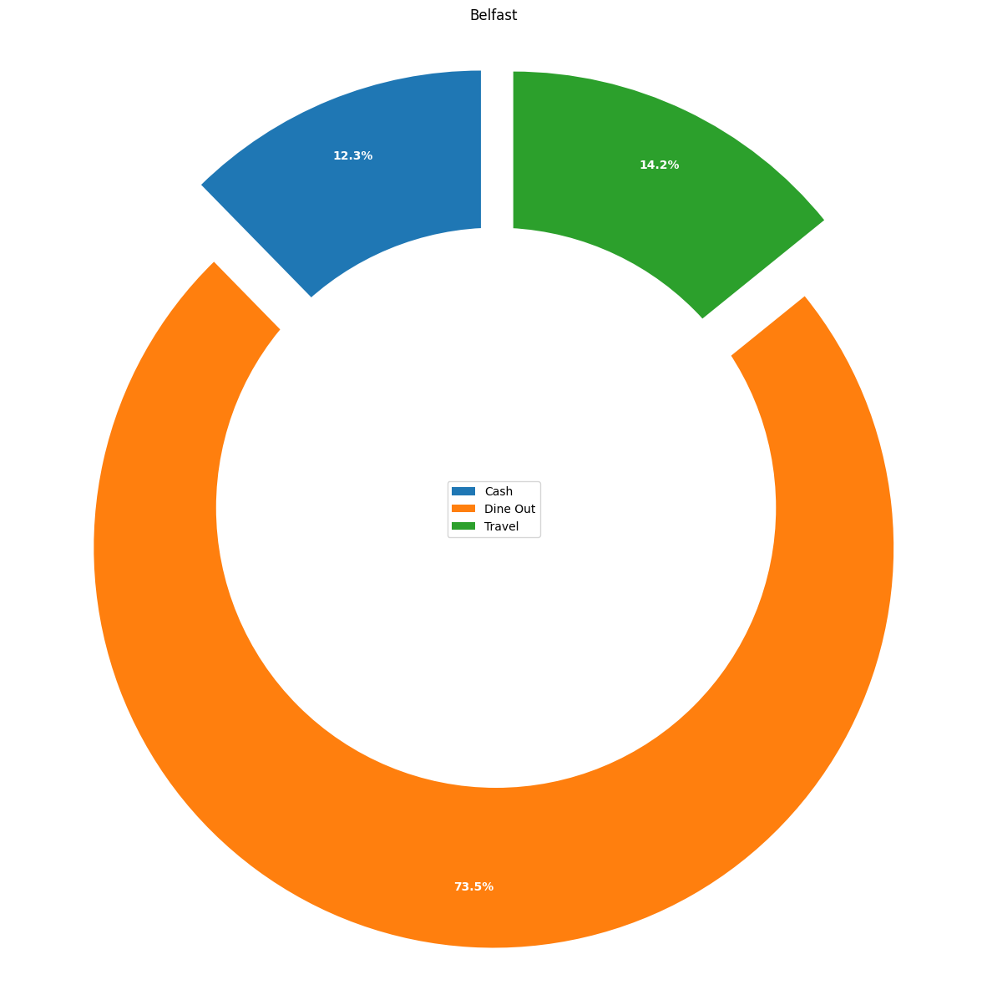
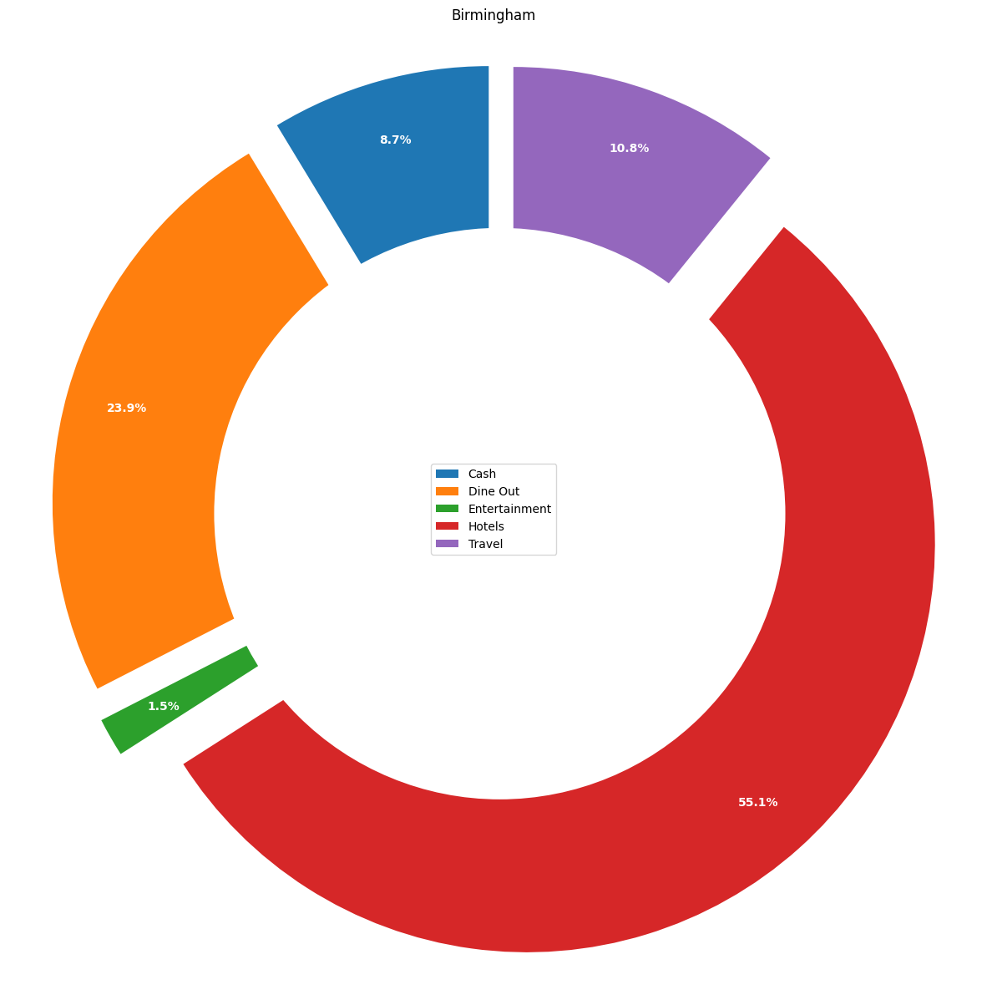
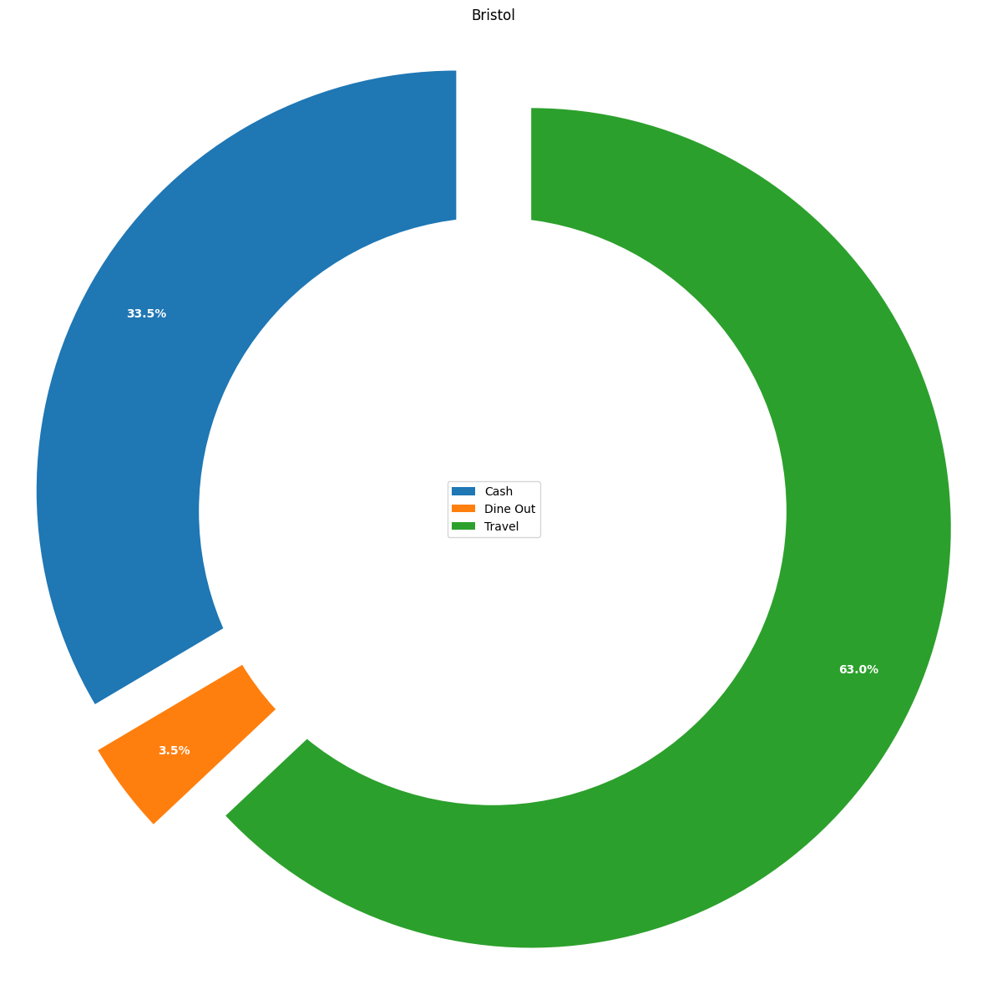
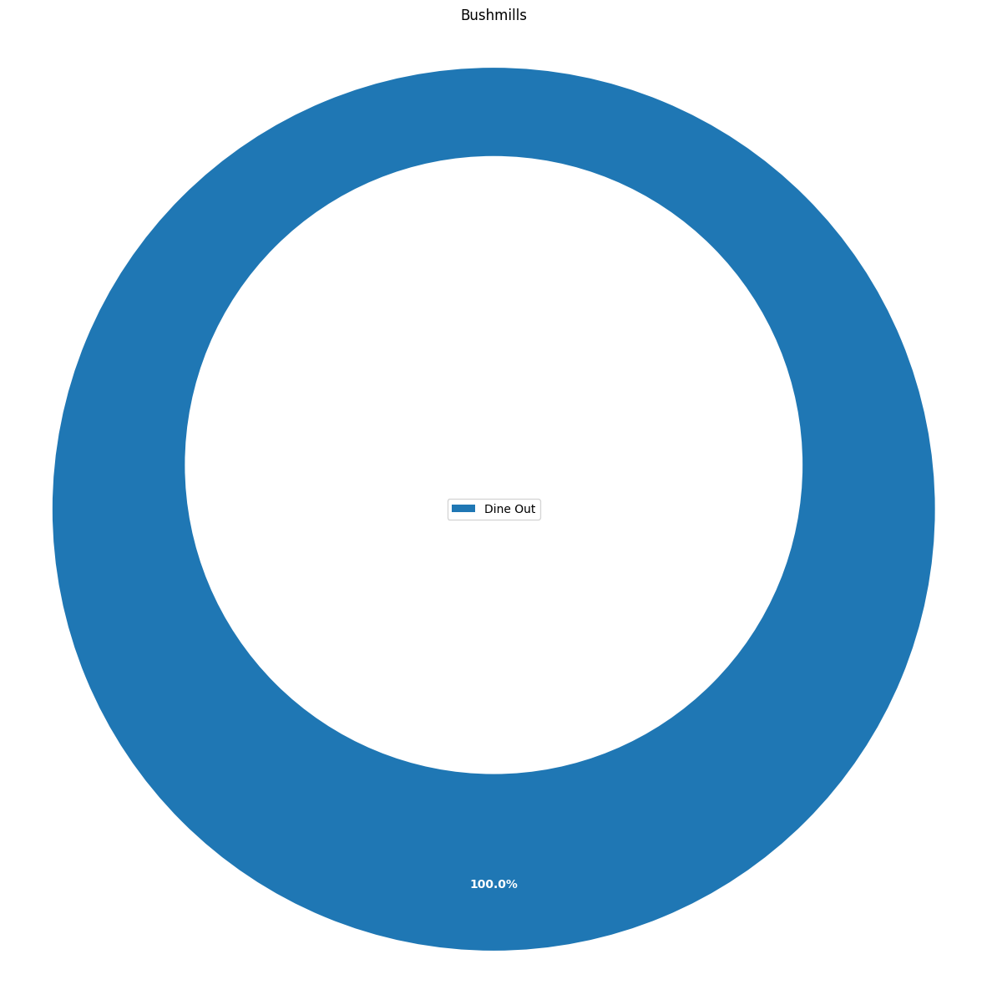
...
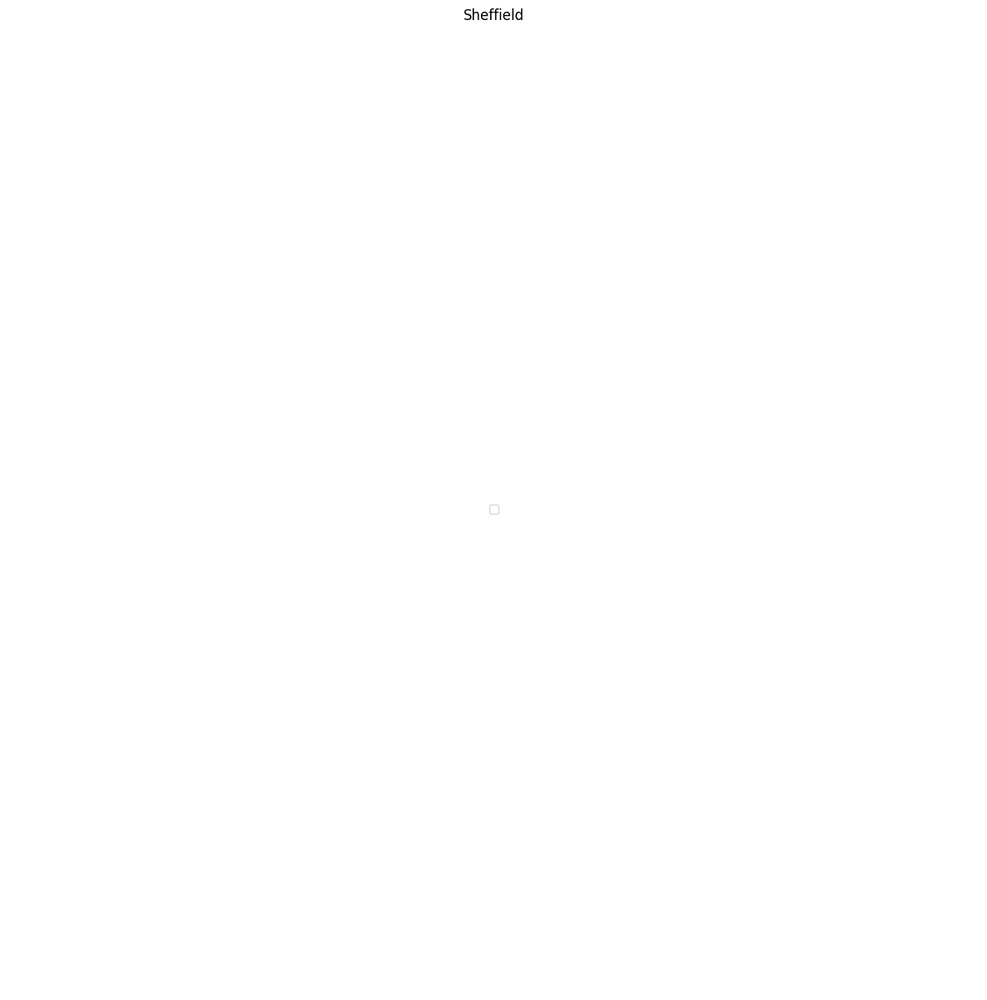
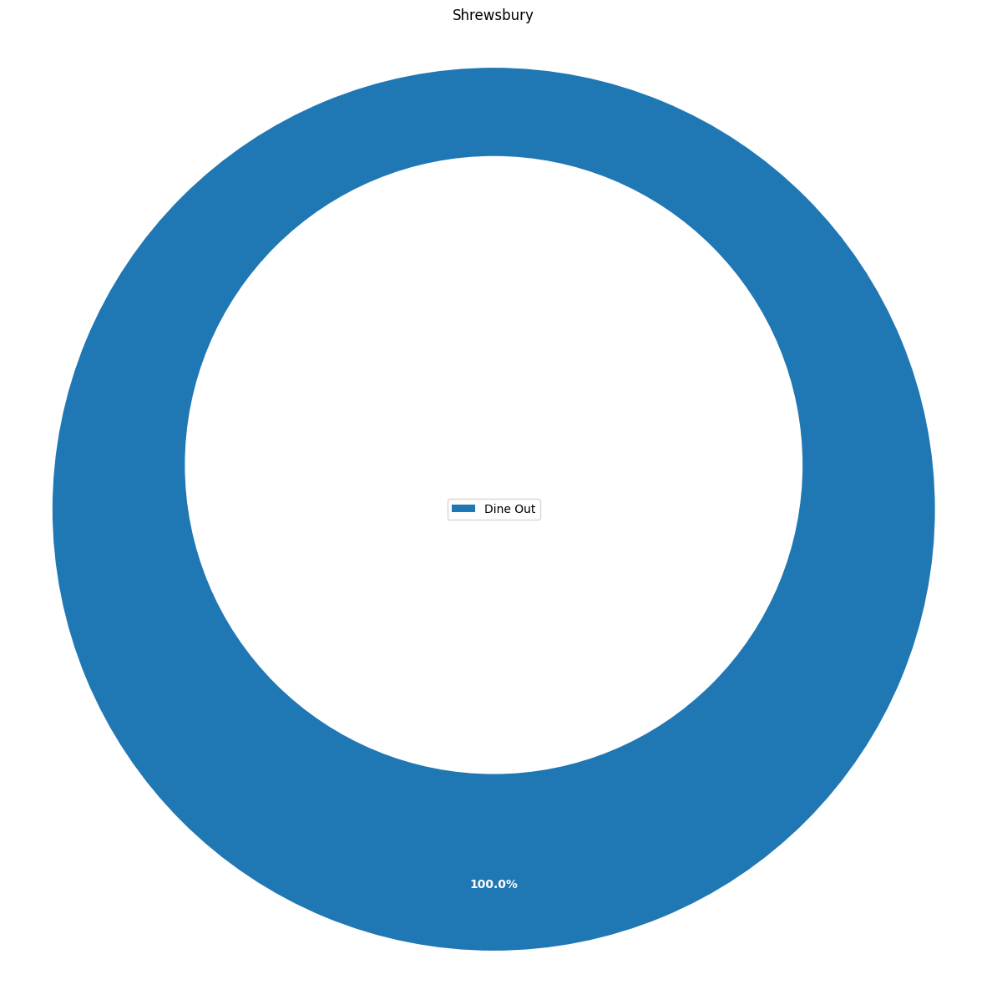
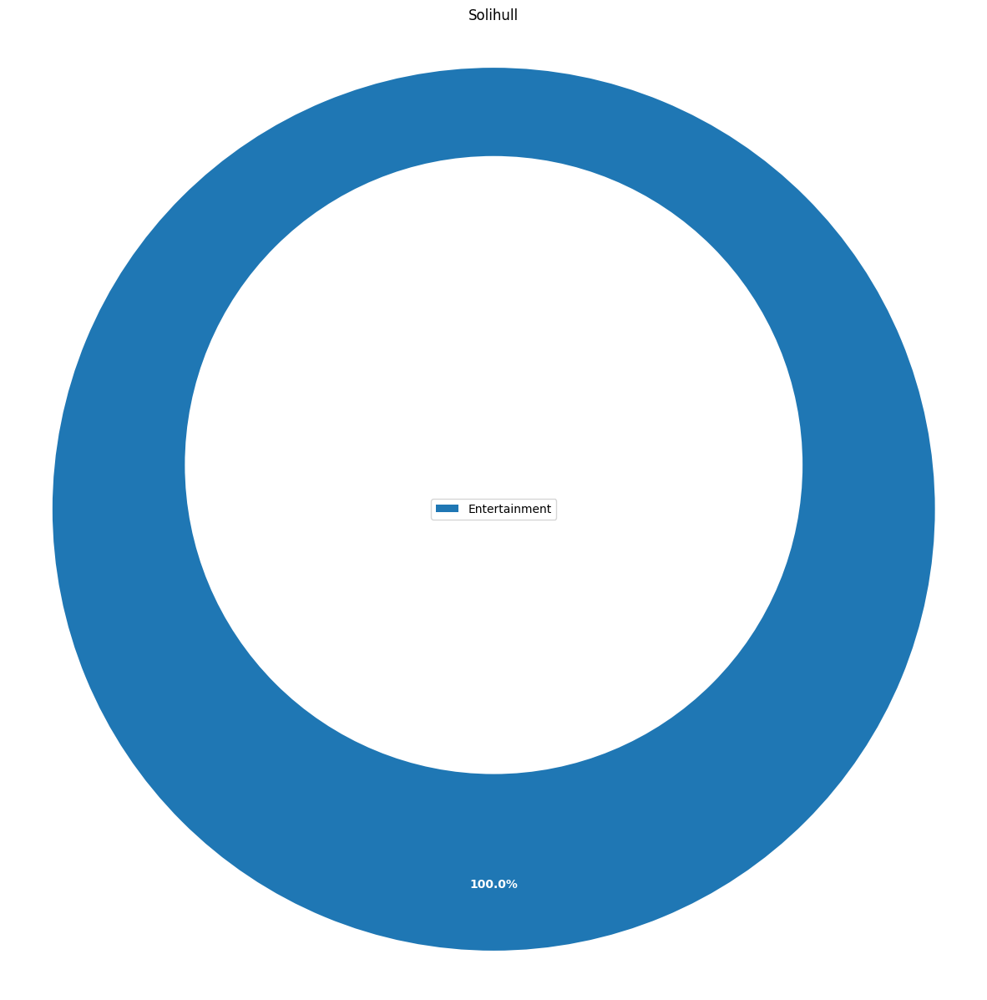
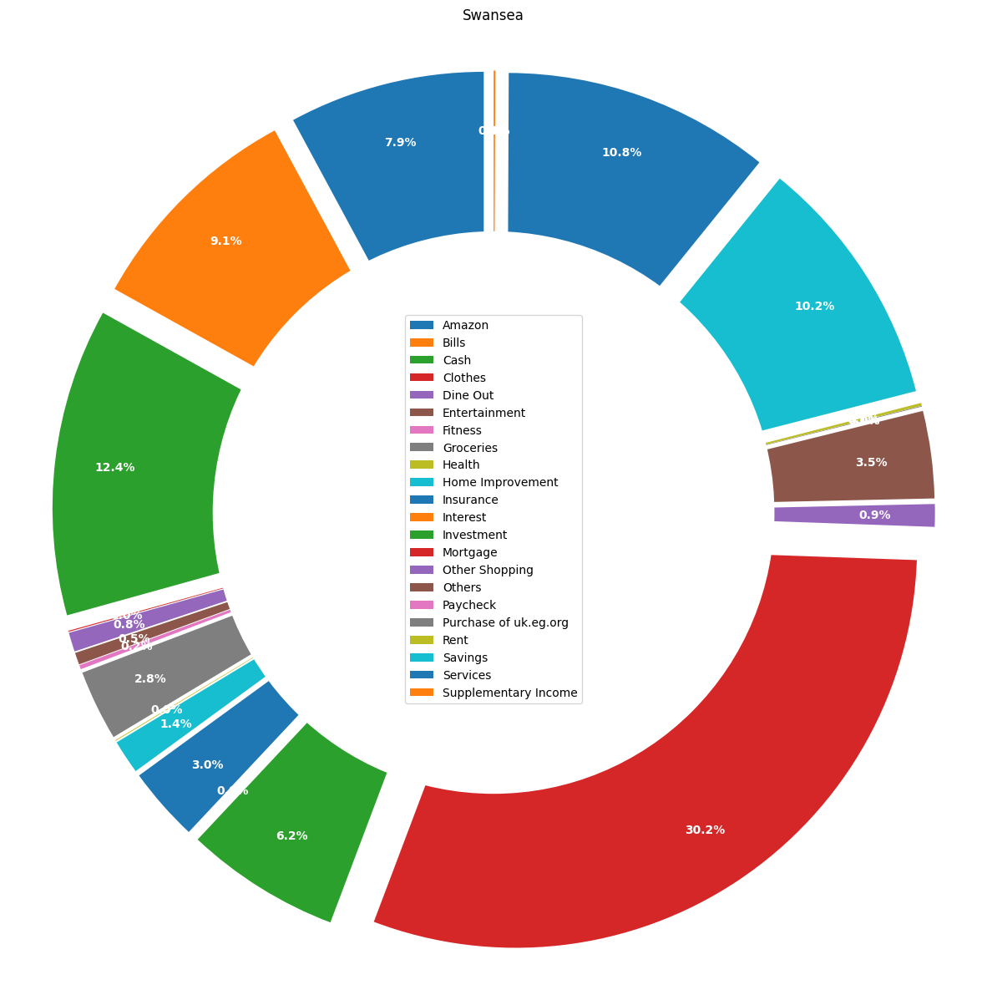
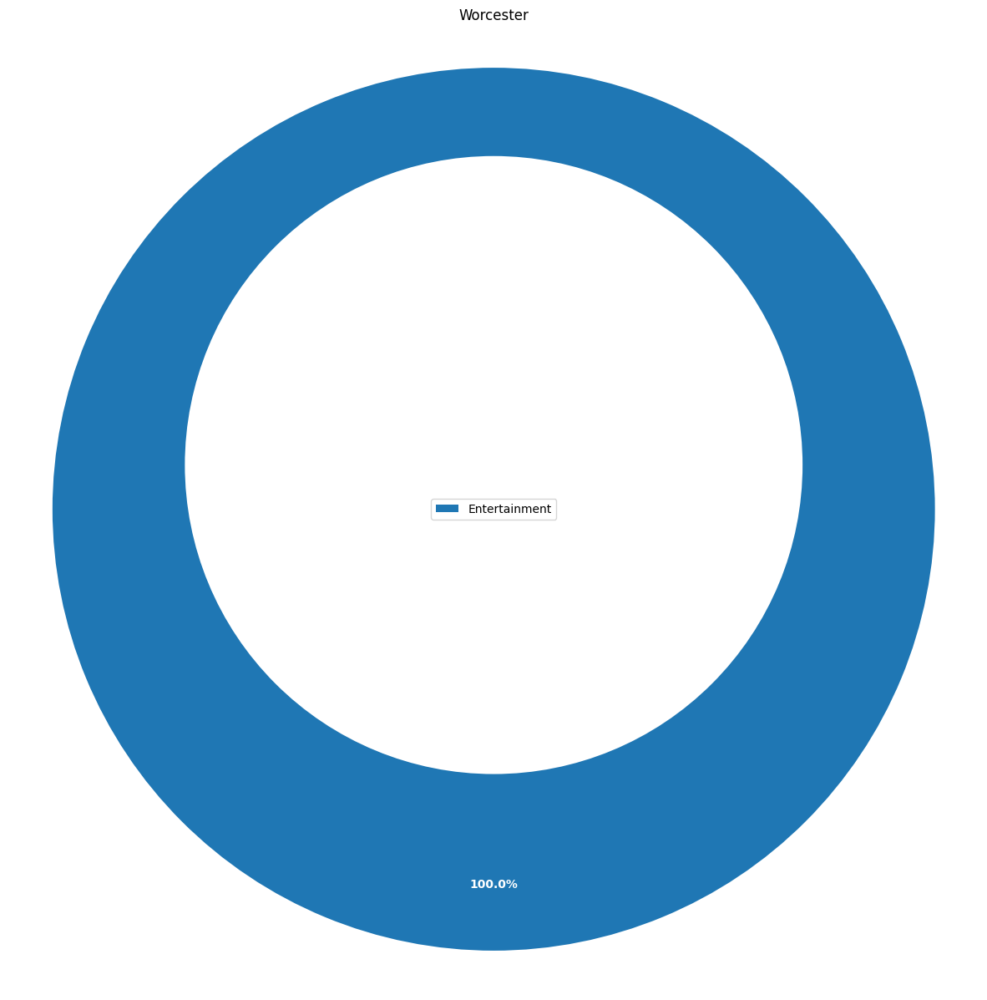

In [64]:
import plotly.io as pio
import matplotlib.pyplot as plt
import base64
from io import BytesIO
import os



def find_coo(a):
  b=df_uk_cities[df_uk_cities["Location City"]==a][["Category","Debit Amount"]]
  return b

cities = {
    'Bargoed': {'coords': [51.6912, -3.2290], 'data': find_coo("Bargoed")},
    'Belfast': {'coords': [54.5973, -5.9301], 'data': find_coo("Belfast")},
    'Birmingham': {'coords': [52.4862, -1.8904],'data': find_coo("Birmingham")},
    'Bristol': {'coords': [51.4545, -2.5879],'data': find_coo("Bristol")},
    'Bushmills': {'coords': [55.2045, -6.5117],'data': find_coo("Bushmills")},
    'Cambridge': {'coords': [52.2053, 0.1218],'data': find_coo("Cambridge")},
    'Cardiff': {'coords': [51.4816, -3.1791],'data': find_coo("Cardiff")},
    'Derby': {'coords': [52.9225, -1.4746],'data': find_coo("Derby")},
    'Lampeter': {'coords': [52.1133, -4.0769],'data': find_coo("Lampeter")},
    'Leeds': {'coords': [53.8008, -1.5491],'data': find_coo("Leeds")},
    'Leicester': {'coords': [52.6369, -1.1398],'data': find_coo("Leicester")},
    'London': {'coords': [51.5074, -0.1278],'data': find_coo("London")},
    'Manchester': {'coords': [53.4808, -2.2426],'data': find_coo("Manchester")},
    'Mansfield': {'coords': [53.1439, -1.1962],'data': find_coo("Mansfield")},
    'Middleton': {'coords': [53.5500, -2.1989],'data': find_coo("Middleton")},
    'Newcastle upon Tyne': {'coords': [54.9783, -1.6175],'data': find_coo("Newcastle upon Tyne")},
    'Nottingham': {'coords': [52.9548, -1.1581],'data': find_coo("Nottingham")},
    'Oakham': {'coords': [52.6705, -0.7260],'data': find_coo("Oakham")},
    'Plymouth': {'coords': [50.3755, -4.1427],'data': find_coo("Plymouth")},
    'Reading': {'coords': [51.4543, -0.9781],'data': find_coo("Reading")},
    'Sheerness': {'coords': [51.4406, 0.7605],'data': find_coo("Sheerness")},
    'Sheffield': {'coords': [53.3811, -1.4701],'data': find_coo("Sheffield")},
    'Shrewsbury': {'coords': [52.7073, -2.7553],'data': find_coo("Shrewsbury")},
    'Solihull': {'coords': [52.4128, -1.7782],'data': find_coo("Solihull")},
    'Swansea': {'coords': [51.6214, -3.9436],'data': find_coo("Swansea")},
    'Worcester': {'coords': [52.1920, -2.2200],'data': find_coo("Worcester")}
}


temp_folder = "temp_pie_charts"
if not os.path.exists(temp_folder):
    os.makedirs(temp_folder)

uk_map = folium.Map(location=[54.0, -2.0], zoom_start=6)


for city, info in cities.items():
    data = info['data']
    coords = info['coords']


    fig, ax = plt.subplots(figsize=(15, 15))


    explode = [0.1] * len(data['Category'])

    wedges, texts, autotexts = ax.pie(
        data['Debit Amount'],
        autopct='%1.1f%%',
        startangle=90,
        explode=explode,
        pctdistance=0.85
    )


    for text in texts:
        text.set_fontsize(10)
    for autotext in autotexts:
        autotext.set_fontsize(10)
        autotext.set_color('white')
        autotext.set_weight('bold')


    centre_circle = plt.Circle((0, 0), 0.70, fc='white')
    fig.gca().add_artist(centre_circle)

    ax.axis('equal')
    plt.legend(data["Category"],loc="center")
    ax.set_aspect('equal')
    plt.title(city)

    #buf = BytesIO()
    #plt.savefig(buf, format='png')
    #buf.seek(0)
    #img_base64 = base64.b64encode(buf.read()).decode('utf8')
    #buf.close()
    #plt.close(fig)
    #return img_base64

    png_path = os.path.join(temp_folder, f"{city}.png")
    plt.savefig(png_path, format='png', bbox_inches='tight')
    plt.close(fig)


    with open(png_path, "rb") as f:
        png_base64 = base64.b64encode(f.read()).decode("utf-8")





    html = f"""
        <h4>{city}</h4>
        <img src="data:image/png;base64,{png_base64}"  width="100" height="100">
    """
    iframe = folium.IFrame(html, width=150, height=150)
    popup = folium.Popup(iframe, max_width=145)
    icon = folium.CustomIcon(icon_image=png_path, icon_size=(50, 50))
    folium.Marker(location=coords, icon=icon, popup=popup).add_to(uk_map)



    #plt.close(fig)

    uk_map.save('uk_map_with_pie_charts.html')
uk_map

In [65]:
import folium
from folium import plugins
import pandas as pd
import matplotlib.pyplot as plt
import base64
from io import BytesIO
import requests




def find_coo(city):
    return df_uk_cities[df_uk_cities["Location City"] == city][["Category", "Debit Amount"]]


cities = {
    'Bargoed': {'coords': [51.6912, -3.2290], 'data': find_coo("Bargoed")},
    'Belfast': {'coords': [54.5973, -5.9301], 'data': find_coo("Belfast")},
    'Birmingham': {'coords': [52.4862, -1.8904], 'data': find_coo("Birmingham")},
    'Bristol': {'coords': [51.4545, -2.5879], 'data': find_coo("Bristol")},
    'Bushmills': {'coords': [55.2045, -6.5117], 'data': find_coo("Bushmills")},
    'Cambridge': {'coords': [52.2053, 0.1218], 'data': find_coo("Cambridge")},
    'Cardiff': {'coords': [51.4816, -3.1791], 'data': find_coo("Cardiff")},
    'Derby': {'coords': [52.9225, -1.4746], 'data': find_coo("Derby")},
    'Lampeter': {'coords': [52.1133, -4.0769], 'data': find_coo("Lampeter")},
    'Leeds': {'coords': [53.8008, -1.5491], 'data': find_coo("Leeds")},
    'Leicester': {'coords': [52.6369, -1.1398], 'data': find_coo("Leicester")},
    'London': {'coords': [51.5074, -0.1278], 'data': find_coo("London")},
    'Manchester': {'coords': [53.4808, -2.2426], 'data': find_coo("Manchester")},
    'Middleton': {'coords': [53.5500, -2.1989], 'data': find_coo("Middleton")},
    'Newcastle upon Tyne': {'coords': [54.9783, -1.6175], 'data': find_coo("Newcastle upon Tyne")},
    'Nottingham': {'coords': [52.9548, -1.1581], 'data': find_coo("Nottingham")},
    'Oakham': {'coords': [52.6705, -0.7260], 'data': find_coo("Oakham")},
    'Plymouth': {'coords': [50.3755, -4.1427], 'data': find_coo("Plymouth")},
    'Reading': {'coords': [51.4543, -0.9781], 'data': find_coo("Reading")},
    'Sheerness': {'coords': [51.4406, 0.7605], 'data': find_coo("Sheerness")},
    'Shrewsbury': {'coords': [52.7073, -2.7553], 'data': find_coo("Shrewsbury")},
    'Solihull': {'coords': [52.4128, -1.7782], 'data': find_coo("Solihull")},
    'Swansea': {'coords': [51.6214, -3.9436], 'data': find_coo("Swansea")},
    'Worcester': {'coords': [52.1920, -2.2200], 'data': find_coo("Worcester")}
}


min_data = min(city['data']["Debit Amount"].sum() for city in cities.values())
max_data = max(city['data']["Debit Amount"].sum() for city in cities.values())


def scale_radius(value, min_data, max_data, min_radius=5, max_radius=20):
    return min_radius + (max_radius - min_radius) * (value - min_data) / (max_data - min_data)

def create_pie_chart(data):

    fig, ax = plt.subplots(figsize=(15, 15))


    explode = [0.1] * len(data['Category'])

    wedges, texts, autotexts = ax.pie(
        data['Debit Amount'],
        autopct='%1.1f%%',
        startangle=90,
        explode=explode,
        pctdistance=0.85
    )


    for text in texts:
        text.set_fontsize(10)
    for autotext in autotexts:
        autotext.set_fontsize(10)
        autotext.set_color('white')
        autotext.set_weight('bold')


    centre_circle = plt.Circle((0, 0), 0.70, fc='white')
    fig.gca().add_artist(centre_circle)

    ax.axis('equal')
    plt.legend(data["Category"],loc="center")
    ax.set_aspect('equal')

    buf = BytesIO()
    plt.savefig(buf, format='png')
    buf.seek(0)
    img_base64 = base64.b64encode(buf.read()).decode('utf8')
    buf.close()
    plt.close(fig)
    return img_base64


uk_map = folium.Map(location=[54.0, -2.0], zoom_start=6)


for city, info in cities.items():
    coords = info['coords']
    data = info['data']
    radius = scale_radius(data["Debit Amount"].sum(), min_data, max_data)

    img_base64 = create_pie_chart(data)
    html = f"""
        <h4>{city}</h4>
        <img src="data:image/png;base64,{img_base64}"  width="500" height="500">
    """
    iframe = folium.IFrame(html, width=500, height=500)
    popup = folium.Popup(iframe, max_width=500)

    folium.CircleMarker(
        location=coords,
        radius=radius,
        popup=popup,
        color='blue',
        fill=True,
        fill_color='blue'
    ).add_to(uk_map)


uk_map.save('uk_map_with_bubble_charts.html')
uk_map

In [66]:
cat_type_amount = df_data.groupby(['Category', 'Transaction Type'],
                               as_index=False).agg({'Debit Amount': pd.Series.sum})
cat_type_amount.sort_values('Debit Amount', ascending=False, inplace=True)
cat_type_amount=cat_type_amount[cat_type_amount["Debit Amount"]>=1000]

In [67]:
df_a = df_data.reset_index()
aylik_harcama = df_a.groupby(['Category', df_a['Transaction Date'].dt.year])['Debit Amount'].sum().reset_index()
aylik_harcama.sort_values('Debit Amount', ascending=False, inplace=True)
aylik_harcama=aylik_harcama[aylik_harcama["Debit Amount"]>2000]
aylik_harcama

,Category,Transaction Date,Debit Amount
0,Account transfer,2020,"84,000.00"
95,Investment,2020,"56,666.00"
94,Investment,2019,"31,120.00"
96,Investment,2021,"30,683.69"
100,Mortgage,2017,"16,406.75"
15,Bills,2021,"14,809.82"
69,Home Improvement,2020,"11,831.29"
101,Mortgage,2018,"11,512.92"
102,Mortgage,2019,"10,802.86"
97,Investment,2022,"10,106.96"


In [68]:
v_bar_split = px.bar(x = aylik_harcama["Category"],
                     y = aylik_harcama["Debit Amount"],
                     color = aylik_harcama["Transaction Date"],
                     title='Total Amount per Category split by Transaction Years',
                     text=aylik_harcama["Transaction Date"])

v_bar_split.update_layout(xaxis_title='Category',
                          yaxis_title='Total Debit Amount',
                          )
v_bar_split.show()

In [69]:
v_bar_split = px.bar(x = cat_type_amount["Category"],
                     y = cat_type_amount["Debit Amount"],
                     color = cat_type_amount["Transaction Type"],
                     title='Total Amount per Category split by Transaction Types',
                     text=cat_type_amount["Transaction Type"])

v_bar_split.update_layout(xaxis_title='Category',
                          yaxis_title='Total Debit Amount',
                          )
v_bar_split.show()

In [70]:
df_data.index.year.unique()

Index([2022, 2021, 2020, 2019, 2018, 2017, 2016, 2015], dtype='int32', name='Transaction Date')

In [71]:
df_a = df_data.reset_index()
aylik_harcama2 = df_a.groupby(['Category', df_a['Transaction Date'].dt.year])['Debit Amount'].sum().reset_index()

In [72]:
l_chart = px.line(aylik_harcama2,
                  x='Transaction Date',
                  y='Debit Amount',
                  color='Category',
                  hover_name='Category',
                  markers=True
              )

l_chart.update_layout(xaxis_title='Year',
                      yaxis_title='Debit Amount per Category',
                      title="Line graph showing the spending amounts of all categories by year")

l_chart.show()

In [73]:
df_data.Category.unique()

array(['Savings', 'Groceries', 'Others', nan, 'Entertainment', 'Services',
       'Amazon', 'Investment', 'Supplementary Income', 'Dine Out',
       'Travel', 'Bills', 'Other Shopping', 'Cash', 'Home Improvement',
       'Hotels', 'Travel Reimbursement', 'Safety Deposit Return',
       'Interest', 'Fitness', 'Paycheck', 'Food Shopping', 'Clothes',
       'Services/Home Improvement', 'Account transfer', 'Mortgage',
       'Insurance', 'Rent', 'Purchase of uk.eg.org', 'Groceries ',
       'Health'], dtype=object)

In [74]:
cate_sav =df_data["Debit Amount"][df_data["Category"]=="Savings"].resample("Y").sum()
cate_sav



Transaction Date
2015-12-31   1,576.64
2016-12-31   3,710.90
2017-12-31   3,741.34
2018-12-31   3,694.69
2019-12-31   3,734.99
2020-12-31   3,733.36
2021-12-31   4,219.47
2022-12-31   2,271.57
Freq: A-DEC, Name: Debit Amount, dtype: float64

In [75]:
cate_gro =df_data["Debit Amount"][df_data["Category"]=="Groceries"].resample("Y").sum()


In [76]:
cate_din =df_data["Debit Amount"][df_data["Category"]=="Dine Out"].resample("Y").sum()

In [77]:
cate_ent =df_data["Debit Amount"][df_data["Category"]=="Entertainment"].resample("Y").sum()

In [78]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=2, cols=2,
                    shared_xaxes=True,
                    vertical_spacing=0.02,
                    subplot_titles=("Savings Subplot","Groceries Subplot", "Dinner Out Subplot","Entertainment Subplot"))

fig.add_trace(go.Scatter(x=cate_sav.index.year, y=cate_sav.values, name="Savings"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=cate_sav.index.year, y=cate_gro.values, name="Groceries"),
              row=1, col=2)

fig.add_trace(go.Scatter(x=cate_sav.index.year, y=cate_din.values, name="Dinner Out"),
              row=2, col=1)

fig.add_trace(go.Scatter(x=cate_sav.index.year, y=cate_ent.values, name="Entertainment"),
              row=2, col=2)

fig.update_layout(height=600, width=1000,
                  title_text="Annual spending amounts by some categories",
    template="plotly_dark",
    margin=dict(r=10, t=60, b=40, l=60),)
fig.show()



<Axes: ylabel='Credit Amount'>

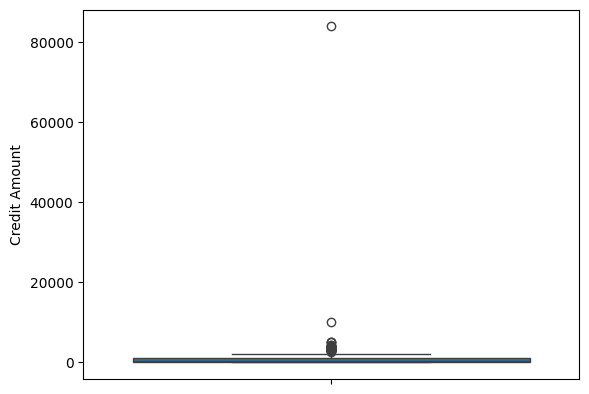

In [79]:
sns.boxplot(df_data["Credit Amount"])


<Axes: ylabel='Debit Amount'>

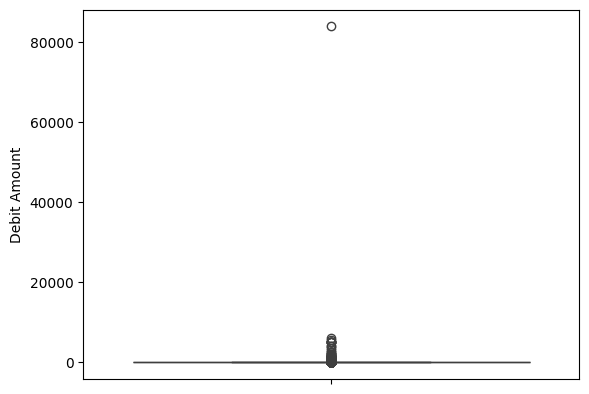

In [80]:
sns.boxplot(df_data["Debit Amount"])

In [81]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6567 entries, 2022-07-25 to 2015-07-27
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Transaction Number       6567 non-null   int64  
 1   Transaction Type         6506 non-null   object 
 2   Transaction Description  6567 non-null   object 
 3   Debit Amount             6122 non-null   float64
 4   Credit Amount            445 non-null    float64
 5   Balance                  6567 non-null   float64
 6   Category                 6543 non-null   object 
 7   Location City            5895 non-null   object 
 8   Location Country         5881 non-null   object 
 9   ISO                      5881 non-null   object 
dtypes: float64(3), int64(1), object(6)
memory usage: 564.4+ KB


In [82]:
debit_months =df_data["Credit Amount"].resample("D").sum().reset_index()
i = debit_months[((debit_months["Credit Amount"] == 83843.54))].index
debit_months.drop(i, axis=0,inplace=True)
debit_months

,Transaction Date,Credit Amount
0,2015-07-27,0.00
1,2015-07-28,0.00
2,2015-07-29,0.00
3,2015-07-30,0.00
4,2015-07-31,"3,545.99"
...,...,...
2551,2022-07-21,0.00
2552,2022-07-22,0.00
2553,2022-07-23,0.00
2554,2022-07-24,0.00


In [83]:
fig = px.line(debit_months, x=debit_months["Transaction Date"], y=debit_months["Credit Amount"], title='Time Series with Range Slider and Selectors')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

In [84]:
debit_dayss =df_data[["Credit Amount","Debit Amount"]].resample("D").sum().reset_index()
i = debit_dayss[((debit_dayss["Credit Amount"] == 83843.54))].index
b = debit_dayss[((debit_dayss["Debit Amount"] == 84281.17))].index
debit_dayss.drop(i, axis=0,inplace=True)
debit_dayss.drop(b, axis=0,inplace=True)
debit_dayss

,Transaction Date,Credit Amount,Debit Amount
0,2015-07-27,0.00,"1,322.90"
1,2015-07-28,0.00,6.59
2,2015-07-29,0.00,92.99
3,2015-07-30,0.00,7.32
4,2015-07-31,"3,545.99",56.07
...,...,...,...
2551,2022-07-21,0.00,35.00
2552,2022-07-22,0.00,206.72
2553,2022-07-23,0.00,0.00
2554,2022-07-24,0.00,0.00


In [85]:
from plotly.subplots import make_subplots
fig = make_subplots(
    rows=2, cols=1,
    shared_xaxes=True,
    vertical_spacing=0.03,
    specs=[[{"type": "scatter"}],
           [{"type": "scatter"}]]
)
fig.add_trace(
    go.Scatter(
        x=debit_dayss["Transaction Date"],
        y=debit_dayss["Credit Amount"],
        mode="lines",
        name="credit amount"
    ),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(
        x=debit_dayss["Transaction Date"],
        y=debit_dayss["Debit Amount"],
        mode="lines",
        name="debit amount"
    ),
    row=2, col=1
)
fig.update_layout(
    height=700,
    showlegend=False,
    title_text="Debit vs Credit ",
    template="plotly_dark"
)

fig.show()



In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score,confusion_matrix

In [ ]:
len(df_data[df_data["Transaction Description"].isnull()])

0

In [ ]:
df_data[df_data["Category"].isnull()]

,Transaction Number,Transaction Type,Transaction Description,Debit Amount,Credit Amount,Balance,Category,Location City,Location Country,ISO
Transaction Date,,,,,,,,,,
2022-07-25,5,DEB,TRAVELIUM LLC,12.59,NaN,560.43,NaN,NaN,NaN,NaN
2021-12-29,799,DEB,GOOGLE *YouTube Vi,3.49,NaN,"3,816.25",NaN,Nottingham,UK,GBR
2021-11-10,971,FPO,L CATATE,20.00,NaN,"1,731.95",NaN,Nottingham,UK,GBR
2021-07-12,1358,DEB,GOOGLE *YouTube Vi,3.49,NaN,"1,332.47",NaN,Nottingham,UK,GBR
2021-03-29,1721,DEB,WAITROSE 833,10.23,NaN,184.64,NaN,Nottingham,UK,GBR
2020-10-06,2232,TFR,R LAWRENCE,200.00,NaN,"3,669.80",NaN,NaN,NaN,NaN
2020-09-22,2277,FPO,EDWARD HANDS & LEW,350.00,NaN,"2,164.11",NaN,NaN,NaN,NaN
2020-09-21,2279,TFR,R LAWRENCE,300.00,NaN,"2,514.13",NaN,NaN,NaN,NaN
2020-08-19,2355,DEB,SUMUP *THE PLANT,6.50,NaN,"2,299.39",NaN,NaN,NaN,NaN


In [ ]:
df_data["Category"] = df_data["Category"].fillna("Other")

df_data[df_data["Category"].isnull()]

,Transaction Number,Transaction Type,Transaction Description,Debit Amount,Credit Amount,Balance,Category,Location City,Location Country,ISO
Transaction Date,,,,,,,,,,


In [ ]:
x= df_data["Transaction Description"].values
y= df_data["Category"].values


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2,random_state=42)

vectorizer = CountVectorizer() # metin değerlerini sayısal bir vektörleme formatına dönüştürür
x_train_vectorized = vectorizer.fit_transform(x_train) #Bu metodun kullanımı, eğitim verileri üzerinde fit işlemi yaparak bir vektörleme modeli oluşturur
x_test_vectorized = vectorizer.transform(x_test) #Bu durumda, test verileri üzerinde sadece dönüştürme işlemi yapılır ve ayrıca yeni bir model oluşturulmaz.


In [ ]:
random_state = 42
classifier = [DecisionTreeClassifier(random_state = random_state),
             SVC(random_state = random_state),
             RandomForestClassifier(random_state = random_state),
             LogisticRegression(random_state = random_state),
             KNeighborsClassifier()]

dt_param_grid = {"min_samples_split" : range(10,500,20),
                "max_depth": range(1,20,2)}

svc_param_grid = {"kernel" : ["rbf"],
                 "gamma": [0.001, 0.01, 0.1, 1],
                 "C": [1,10,50,100,200,300,1000]}

rf_param_grid = {"max_features": [1,3,10],
                "min_samples_split":[2,3,10],
                "min_samples_leaf":[1,3,10],
                "bootstrap":[False],
                "n_estimators":[100,300],
                "criterion":["gini"]}

logreg_param_grid = {"C":np.logspace(-3,3,7),
                    "penalty": ["l1","l2"]}

knn_param_grid = {"n_neighbors": np.linspace(1,19,10, dtype = int).tolist(),
                 "weights": ["uniform","distance"],
                 "metric":["euclidean","manhattan"]}
classifier_param = [dt_param_grid,
                   svc_param_grid,
                   rf_param_grid,
                   logreg_param_grid,
                   knn_param_grid]

In [ ]:
cv_result = []
best_estimators = []
for i in range(len(classifier)):
    clf = GridSearchCV(classifier[i], param_grid=classifier_param[i], cv = StratifiedKFold(n_splits = 10), scoring = "accuracy", n_jobs = -1,verbose = 1)
    clf.fit(x_train_vectorized,y_train)
    cv_result.append(clf.best_score_)
    best_estimators.append(clf.best_estimator_)
    print(cv_result[i])

Fitting 10 folds for each of 250 candidates, totalling 2500 fits
0.6917914177077675
Fitting 10 folds for each of 28 candidates, totalling 280 fits
0.9476476552598226
Fitting 10 folds for each of 54 candidates, totalling 540 fits
0.9444106463878326
Fitting 10 folds for each of 14 candidates, totalling 140 fits
0.9478377693282635
Fitting 10 folds for each of 40 candidates, totalling 400 fits
0.9335592974832517


Text(0.5, 1.0, 'Cross Validation Scores')

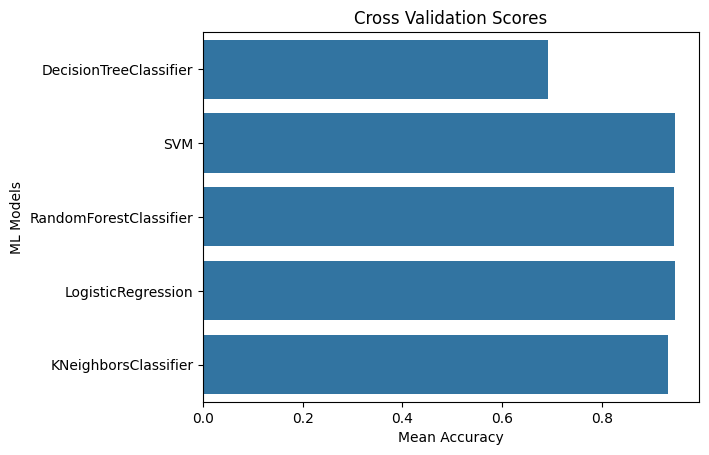

In [ ]:
cv_results = pd.DataFrame({"Cross Validation Means":cv_result, "ML Models":["DecisionTreeClassifier", "SVM","RandomForestClassifier",
             "LogisticRegression",
             "KNeighborsClassifier"]})

g = sns.barplot(x="Cross Validation Means", y="ML Models", data = cv_results)
g.set_xlabel("Mean Accuracy")
g.set_title("Cross Validation Scores")

In [ ]:
votingC = VotingClassifier(estimators = [("svc",best_estimators[0]),
                                        ("rfc",best_estimators[2]),
                                        ("lr",best_estimators[3])],
                                        voting = "soft", n_jobs = -1)
votingC = votingC.fit(x_train_vectorized, y_train)
print(accuracy_score(votingC.predict(x_test_vectorized),y_test))

0.9550989345509894


In [ ]:
predictions = votingC.predict(x_test_vectorized)
predictions

array(['Services/Home Improvement', 'Savings', 'Savings', ..., 'Savings',
       'Cash', 'Cash'], dtype=object)

In [ ]:
list(y_test)
def unique(list1):

    unique_list = []
    for x in list1:

        if x not in unique_list:
            unique_list.append(x)

    return unique_list

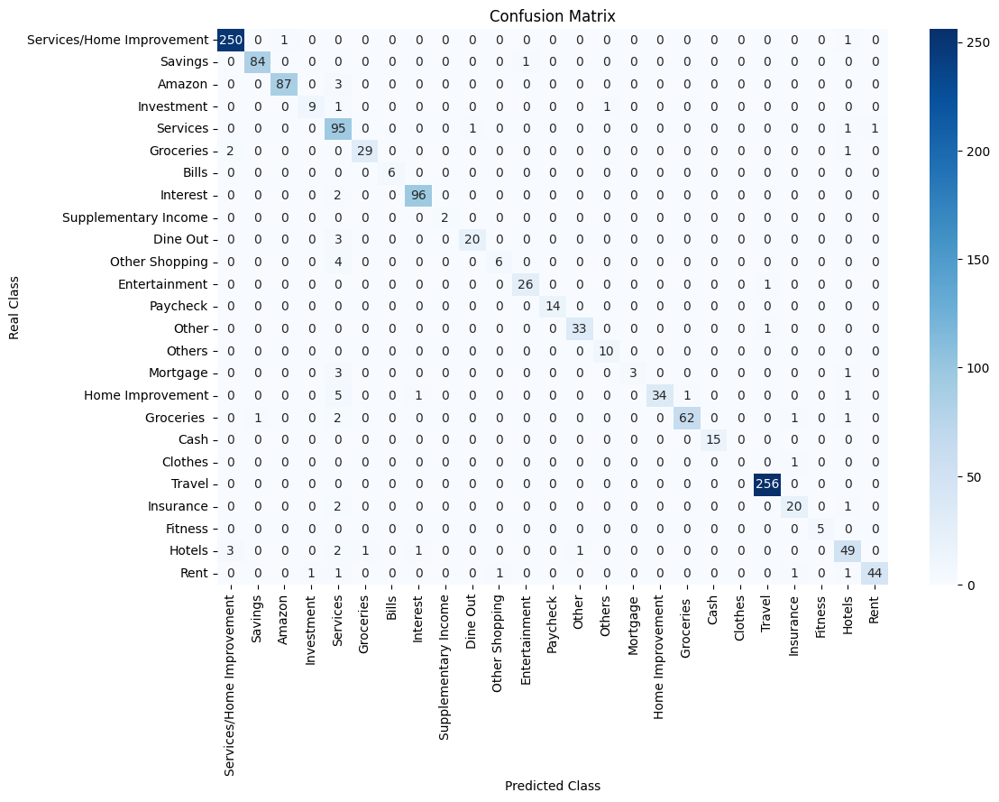

In [ ]:
conf_matrix = confusion_matrix(y_test, predictions)
plt.figure(figsize=(12,8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", yticklabels=unique(list(y_test)),xticklabels=unique(list(y_test)))
plt.xlabel("Predicted Class")
plt.ylabel("Real Class")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
test_cat = pd.Series(votingC.predict(x_test_vectorized), name = "Category")
test_cat

0       Services/Home Improvement
1                         Savings
2                         Savings
3                         Savings
4                         Savings
                  ...            
1309                      Savings
1310                    Insurance
1311                      Savings
1312                         Cash
1313                         Cash
Name: Category, Length: 1314, dtype: object